In [1]:
#import packages
import sys
wython = '/tigress/wenchang/wython'
TCI = '/tigress/wenchang/analysis/TCI'
if wython not in sys.path:
    sys.path.append(wython)
if TCI not in sys.path:
    sys.path.append(TCI)
from matplotlib import path
import xtc
import cftime
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import potential_intensity
from wind_shear import wind_shear
from sklearn.cluster import KMeans
from scipy import stats
from matplotlib.lines import Line2D
from collections import Counter
from scipy.stats import kde
from datetime import datetime
import pickle
from scipy.interpolate import interp1d



#define figure resolution
plt.rcParams['figure.dpi'] = 240

#all precip from model is kg/m2/s, we use this constant to go to mm/day
precip_sf = 3600*24

In [7]:
#make a dictionary of labels for the three different models used

HIRAM = {"model":'HIRAM',
         "ctl": "CTL1990s_v201910_tigercpu_intelmpi_18_540PE",
         "plus2x": "CTL1990s_v201910_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_540PE",
         "tracktag": 'gav_ro110_2p5C_330k',
         "RCP45":'ctl1990s_rcp45_mme_late_tigercpu_intelmpi_18_540PE'
}    

AM25 = {"model":'AM2.5',
         "ctl": "CTL1990s_tigercpu_intelmpi_18_540PE",
         "plus2x": "CTL1990s_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_540PE",
         "tracktag": 'gav_ro110_1C_330k',
         "RCP45":'rcp45_mme_late_tigercpu_intelmpi_18_540PE'
}    
 
AM25C360 = {"model":'AM2.5C360',
         "ctl": "CTL1990s_tigercpu_intelmpi_18_1080PE",
         "plus2x": "CTL1990s_plus2xRegressedLMR2019SST_tigercpu_intelmpi_18_1080PE",
         "tracktag": 'cyclones_gav_ro110_330k', 
         "RCP45":'rcp45_mme_late_tigercpu_intelmpi_18_1080PE'
}

In [10]:
#which model do we want to look at?
model_used = HIRAM #change this line to change the model
exp = model_used

# load climate data

In [4]:
#open CTL data from file
precip_ctl = precip_sf*xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.precip.nc'%(exp['model'],exp['ctl'])) 
tsurf_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.t_surf.nc'%(exp['model'],exp['ctl']))
v850_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v850.nc'%(exp['model'],exp['ctl']))
v200_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v200.nc'%(exp['model'],exp['ctl']))
u850_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u850.nc'%(exp['model'],exp['ctl']))
u200_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u200.nc'%(exp['model'],exp['ctl']))
wind_shear_ctl = wind_shear(u850_ctl, v850_ctl, u200_ctl, v200_ctl)
#omega500_ctl = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.omega.500hPa.nc'%(exp['model'],exp['ctl']))

In [5]:
#open 2XRegressed experiment data from file
precip_2x = precip_sf*xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.precip.nc'%(exp['model'],exp['plus2x'])) 
tsurf_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.t_surf.nc'%(exp['model'],exp['plus2x']))
v850_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v850.nc'%(exp['model'],exp['plus2x']))
v200_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.v200.nc'%(exp['model'],exp['plus2x']))
u850_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u850.nc'%(exp['model'],exp['plus2x']))
u200_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.u200.nc'%(exp['model'],exp['plus2x']))
wind_shear_2x = wind_shear(u850_2x, v850_2x, u200_2x, v200_2x)
#omega500_2x = xr.open_dataarray(f'/tigress/tessj/data/%s.%s.atmos_month.omega.500hPa.nc'%(exp['model'],exp['plus2x']))

In [4]:
#wenchang's script for choosing TCs from a specific basin
from xtc import tc_basins
def tracks_in_basin(ds, basin):
    '''Get the basin bool mask for the tracks dataset.
    **input**:
        ds: tracks dataset;
        basin: basin tag, e.g. "NA" for North Atlantic. 
    **return**:
        in_basin: DataArray of basin mask (bool values)'''
#     ds = xtc.tc_tracks('CTL1860_noleap_tigercpu_intelmpi_18_576PE', years=range(1,11))
#     basin = 'NA'
    # create basin_domain given basin tag, e.g. 'NA' (North Atlantic)
    basins = tc_basins()
    basin_index = basins.map_keys(basin)
    basin_domain = path.Path(basins.coords[basin_index])
    
    # create DataArray of lon/lat pairs
    lon = ds.lon.stack(i_stack=ds.lon.dims)
    lat = ds.lat.stack(i_stack=ds.lat.dims)
    lonlat = xr.concat([lon, lat], dim='lonlat').transpose()
    in_basin = lon.copy().astype('bool') # DataArray to hold the result
    
    # get the basin bool mask for all the tracks
    in_basin.data = basin_domain.contains_points(lonlat)
    in_basin = in_basin.unstack() # unstack to recover the original shape
    
    return in_basin

In [58]:
#load TC tracks for the CTL
if exp==AM25C360:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,201))
elif exp==HIRAM:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,301))
else:
    ds_ctl = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,201))

ds_ctl

years 0101-0300:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; 151; 152; 153; 154; 155; 156; 157; 158; 159; 160; 161; 162; 163; 164; 165; 166; 167; 168; 169; 170; 171; 172; 173; 174; 175; 176; 177; 178; 179; 180; 181; 182; 183; 184; 185; 186; 187; 188; 189; 190; 191; 192; 193; 194; 195; 196; 197; 198; 199; 200; 201; 202; 203; 204; 205; 206; 207; 208; 209; 210; 211; 212; 213; 214; 215; 216; 217; 218; 219; 220; 221; 222; 223; 224; 225; 226; 227; 228; 229; 230; 231; 232; 233; 234; 235; 236; 237; 238; 239; 240; 241; 242; 243; 244; 245; 246; 247; 248; 249; 250; 251; 252; 253; 254; 255; 256; 257; 258; 259; 260; 261; 262; 263; 264; 265; 266; 267; 268; 269; 270; 271; 272; 273; 274; 275; 276; 277; 278; 279; 280; 281; 282; 283; 284; 285; 286; 287; 288; 289; 290; 291; 292; 293; 294; 295; 296; 297

<xarray.Dataset>
Dimensions:  (stage: 120, storm: 200, year: 200)
Coordinates:
  * storm    (storm) int64 1 2 3 4 5 6 7 8 9 ... 193 194 195 196 197 198 199 200
  * stage    (stage) int64 0 6 12 18 24 30 36 42 ... 678 684 690 696 702 708 714
  * year     (year) int64 101 102 103 104 105 106 ... 295 296 297 298 299 300
Data variables:
    lat      (year, storm, stage) float64 -15.63 -15.84 -16.01 ... nan nan nan
    lon      (year, storm, stage) float64 176.1 177.0 178.5 ... nan nan nan
    windmax  (year, storm, stage) float64 18.71 16.41 17.8 20.89 ... nan nan nan
    slp      (year, storm, stage) float64 991.6 994.8 992.9 ... nan nan nan
    tm       (year, storm, stage) float64 261.3 -1.0 -1.0 263.8 ... nan nan nan
    month    (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    day      (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    hour     (year, storm, stage) float64 6.0 12.0 18.0 24.0 ... nan nan nan nan

In [59]:
#load TC tracks for the 2X experiment
if exp==AM25C360:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,201))
elif exp==HIRAM:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],years=range(101,301))
else:
    ds_2x = xtc.tc_tracks(exp['plus2x'], model=exp['model'],years=range(101,201))

ds_2x

years 0101-0300:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; 151; 152; 153; 154; 155; 156; 157; 158; 159; 160; 161; 162; 163; 164; 165; 166; 167; 168; 169; 170; 171; 172; 173; 174; 175; 176; 177; 178; 179; 180; 181; 182; 183; 184; 185; 186; 187; 188; 189; 190; 191; 192; 193; 194; 195; 196; 197; 198; 199; 200; 201; 202; 203; 204; 205; 206; 207; 208; 209; 210; 211; 212; 213; 214; 215; 216; 217; 218; 219; 220; 221; 222; 223; 224; 225; 226; 227; 228; 229; 230; 231; 232; 233; 234; 235; 236; 237; 238; 239; 240; 241; 242; 243; 244; 245; 246; 247; 248; 249; 250; 251; 252; 253; 254; 255; 256; 257; 258; 259; 260; 261; 262; 263; 264; 265; 266; 267; 268; 269; 270; 271; 272; 273; 274; 275; 276; 277; 278; 279; 280; 281; 282; 283; 284; 285; 286; 287; 288; 289; 290; 291; 292; 293; 294; 295; 296; 297

<xarray.Dataset>
Dimensions:  (stage: 120, storm: 200, year: 200)
Coordinates:
  * storm    (storm) int64 1 2 3 4 5 6 7 8 9 ... 193 194 195 196 197 198 199 200
  * stage    (stage) int64 0 6 12 18 24 30 36 42 ... 678 684 690 696 702 708 714
  * year     (year) int64 101 102 103 104 105 106 ... 295 296 297 298 299 300
Data variables:
    lat      (year, storm, stage) float64 6.18 6.64 7.11 7.59 ... nan nan nan
    lon      (year, storm, stage) float64 73.37 72.37 71.36 ... nan nan nan
    windmax  (year, storm, stage) float64 18.37 17.41 18.24 ... nan nan nan
    slp      (year, storm, stage) float64 1.006e+03 1.001e+03 ... nan nan
    tm       (year, storm, stage) float64 258.5 258.7 258.7 ... nan nan nan
    month    (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    day      (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    hour     (year, storm, stage) float64 6.0 12.0 18.0 24.0 ... nan nan nan nan

In [60]:
#choose the tracks in NA basin
inNA_ctl = tracks_in_basin(ds_ctl, 'NA')
inNA_2x = tracks_in_basin(ds_2x, 'NA')

ds_ctl_NA = ds_ctl.where(inNA_ctl,drop=True)
ds_2x_NA = ds_2x.where(inNA_2x,drop=True)

## load RCP tracks

In [5]:
if exp==AM25C360:
    ds_ctl_rcp45 = xtc.tc_tracks(exp['ctl'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,151))
elif exp==HIRAM:
    ds_ctl_rcp45 = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,151))
else:
    ds_ctl_rcp45 = xtc.tc_tracks(exp['ctl'], model=exp['model'],years=range(101,151))


years 0101-0150:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; year end


In [12]:
if exp==AM25C360:
    ds_rcp45 = xtc.tc_tracks(exp['RCP45'], model=exp['model'],track_tag=exp['tracktag'],years=range(101,151),username='gvecchi')
elif exp==HIRAM:
    ds_rcp45 = xtc.tc_tracks(exp['RCP45'], model=exp['model'],years=range(101,151),username='gvecchi')
else:
    ds_rcp45 = xtc.tc_tracks(exp['RCP45'], model=exp['model'],years=range(101,151),username='gvecchi')

ds_rcp45

years 0101-0150:
101; 102; 103; 104; 105; 106; 107; 108; 109; 110; 111; 112; 113; 114; 115; 116; 117; 118; 119; 120; 121; 122; 123; 124; 125; 126; 127; 128; 129; 130; 131; 132; 133; 134; 135; 136; 137; 138; 139; 140; 141; 142; 143; 144; 145; 146; 147; 148; 149; 150; year end


<xarray.Dataset>
Dimensions:  (stage: 120, storm: 200, year: 50)
Coordinates:
  * stage    (stage) int64 0 6 12 18 24 30 36 42 ... 678 684 690 696 702 708 714
  * storm    (storm) int64 1 2 3 4 5 6 7 8 9 ... 193 194 195 196 197 198 199 200
  * year     (year) int64 101 102 103 104 105 106 ... 145 146 147 148 149 150
Data variables:
    lat      (year, storm, stage) float64 -9.74 -10.46 -10.95 ... nan nan nan
    lon      (year, storm, stage) float64 44.55 43.46 42.46 ... nan nan nan
    windmax  (year, storm, stage) float64 19.73 18.74 19.13 ... nan nan nan
    slp      (year, storm, stage) float64 1.002e+03 998.6 1e+03 ... nan nan nan
    tm       (year, storm, stage) float64 258.7 258.9 258.1 ... nan nan nan
    month    (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    day      (year, storm, stage) float64 1.0 1.0 1.0 1.0 ... nan nan nan nan
    hour     (year, storm, stage) float64 6.0 12.0 18.0 24.0 ... nan nan nan nan

In [13]:
inNA_ctl_rcp45 = tracks_in_basin(ds_ctl_rcp45, 'NA')
inNA_rcp45 = tracks_in_basin(ds_rcp45, 'NA')
ds_ctl_rcp45_NA = ds_ctl_rcp45.where(inNA_ctl_rcp45,drop=True)
ds_rcp45_NA = ds_rcp45.where(inNA_rcp45,drop=True)

# make some timeseries

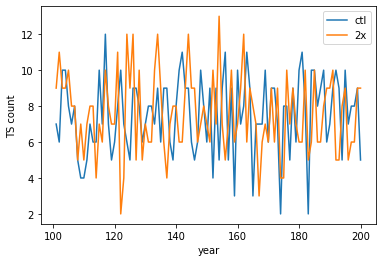

In [13]:
#ts per year = tspy
tspy_ctl_NA = []
for i in ds_ctl_NA.year:
    tspy_ctl_NA.append(len(ds_ctl_NA.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_ctl_NA.year,tspy_ctl_NA,label='ctl')
tspy_2x_NA = []
for i in ds_2x_NA.year:
    tspy_2x_NA.append(len(ds_2x_NA.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_2x_NA.year,tspy_2x_NA,label='2x')
plt.ylabel('TS count')
plt.xlabel('year')
plt.legend()

In [14]:
print(f'fractional change={(sum(tspy_2x_NA)-sum(tspy_ctl_NA))/sum(tspy_ctl_NA)}, average change in number of TS per year={np.mean([a_i - b_i for a_i, b_i in zip(tspy_2x_NA, tspy_ctl_NA)])}')

fractional change=0.0013280212483399733, average change in number of TS per year=0.01


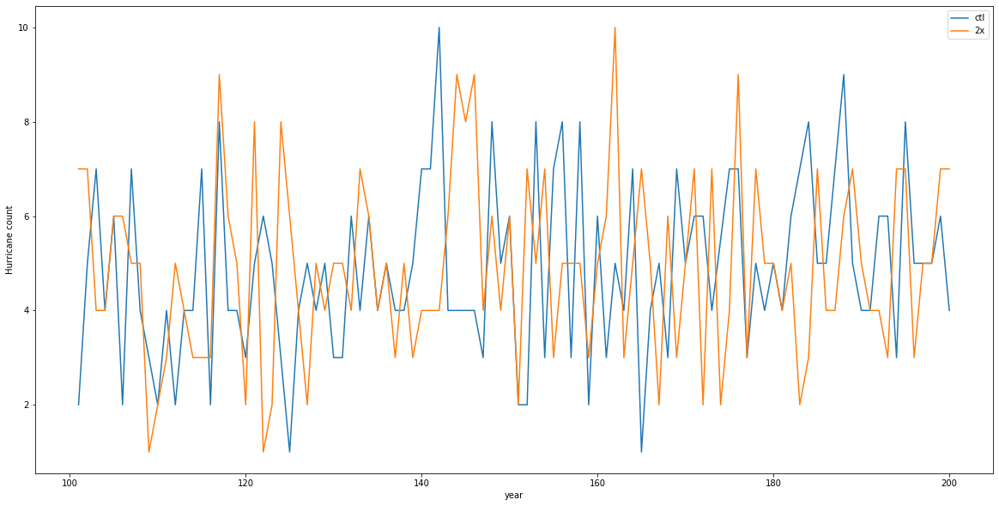

In [15]:
#hurricanes per year = hpy
ds_ctl_NA_hur = ds_ctl_NA.where(ds_ctl_NA.windmax>33.,drop=True)
ds_2x_NA_hur = ds_2x_NA.where(ds_2x_NA.windmax>33.,drop=True)

plt.figure(figsize=(20,10))
hpy_ctl_NA = []
for i in ds_ctl_NA_hur.year:
    hpy_ctl_NA.append(len(ds_ctl_NA_hur.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_ctl_NA_hur.year,hpy_ctl_NA,label='ctl')
hpy_2x_NA = []
for i in ds_2x_NA_hur.year:
    hpy_2x_NA.append(len(ds_2x_NA_hur.sel(year=i).dropna('storm',how='all').storm))
plt.plot(ds_2x_NA_hur.year,hpy_2x_NA,label='2x')
plt.ylabel('Hurricane count')
plt.xlabel('year')#
plt.legend()

In [16]:
print(f'fractional change={(sum(hpy_2x_NA)-sum(hpy_ctl_NA))/sum(hpy_ctl_NA)}, average change in number of TC per year={np.mean([a_i - b_i for a_i, b_i in zip(hpy_2x_NA, hpy_ctl_NA)])}')

fractional change=0.04700854700854701, average change in number of TC per year=0.030927835051546393


# TC density & other climate vars

In [17]:
#use wenchang's tc_density function to make 2d histograms
density_ctl_NA = xtc.tc_density(ds_ctl_NA).mean('time')
density_2x_NA = xtc.tc_density(ds_2x_NA).mean('time')
density_ctl = xtc.tc_density(ds_ctl).mean('time')
density_2x = xtc.tc_density(ds_2x).mean('time')

/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/tessj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Text(0.5, 1.0, 'TC days per month per 10x10deg box')

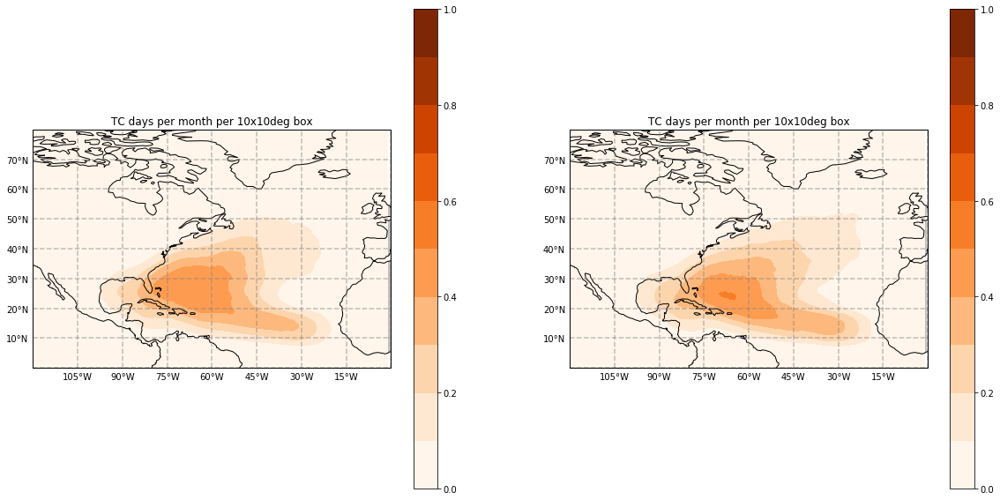

In [18]:
#plot control vs 2x TC density

plt.figure(figsize=(20,10))
ax1=plt.subplot(1,2,1,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
density_ctl_NA.plot.contourf(robust=True,cmap='Oranges',vmax=1,levels=11)
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('TC days per month per 10x10deg box (CTL)')

ax1=plt.subplot(1,2,2,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
density_2x_NA.plot.contourf(robust=True,cmap='Oranges',vmax=1,levels=11)
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('TC days per month per 10x10deg box (2X)')

Text(0.5, 1.0, '$\\Delta$ TC days per month per 10x10deg box')

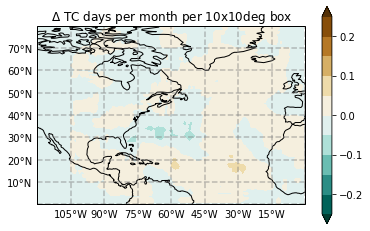

In [19]:
#plot 2x minus ctl in NA, TC density
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax1.set_extent([-120,0,0, 80], ccrs.PlateCarree())
(density_2x_NA - density_ctl_NA).plot.contourf(robust=True,cmap='BrBG_r',vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title('$\Delta$ TC days per month per 10x10deg box')

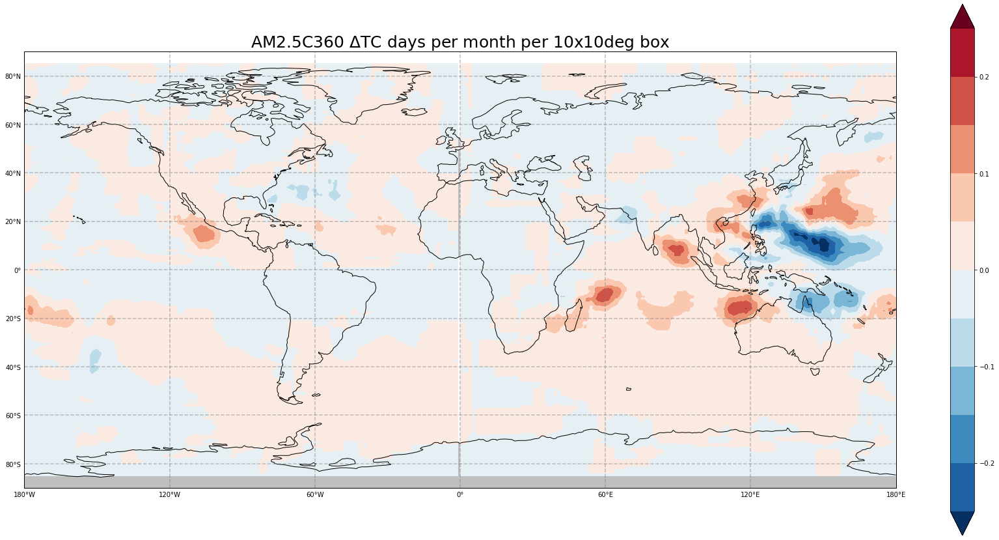

In [21]:
#plot 2x minus ctl, global TC density
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(density_2x - density_ctl).plot.contourf(robust=True,cmap='RdBu_r',vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s $\Delta$TC days per month per 10x10deg box'%exp['model'],fontsize=25)

#plt.savefig(f'%s_tc_density.png'%exp['model'])

Text(0.5, 1.0, 'AM2.5C360 precip anomaly (mm/day)')

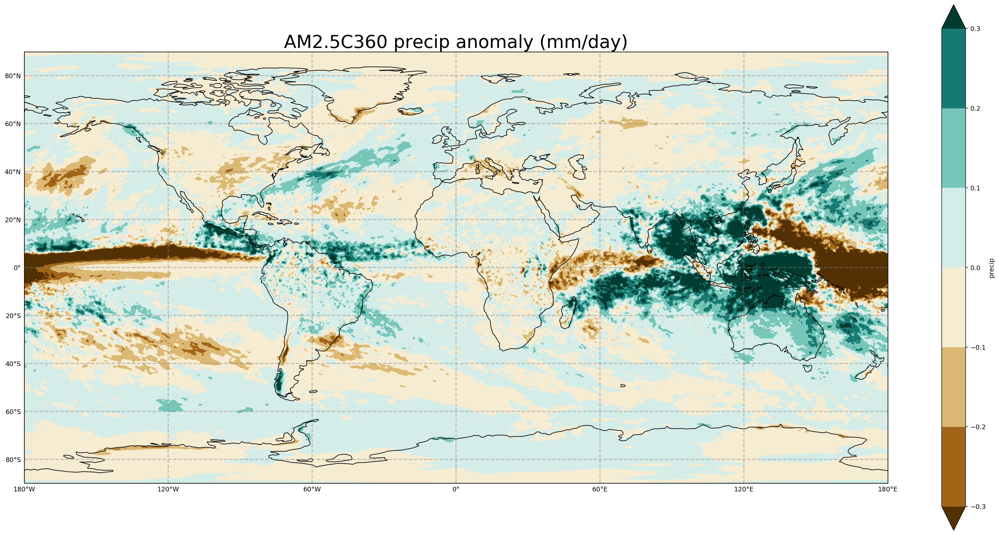

In [17]:
#plot precip anomaly

plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(precip_2x - precip_ctl).mean('time').plot.contourf(robust=True,cmap='BrBG')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s precip anomaly (mm/day)'%exp['model'],fontsize=28)

#plt.savefig(f'%s_precip.png'%exp['model'])

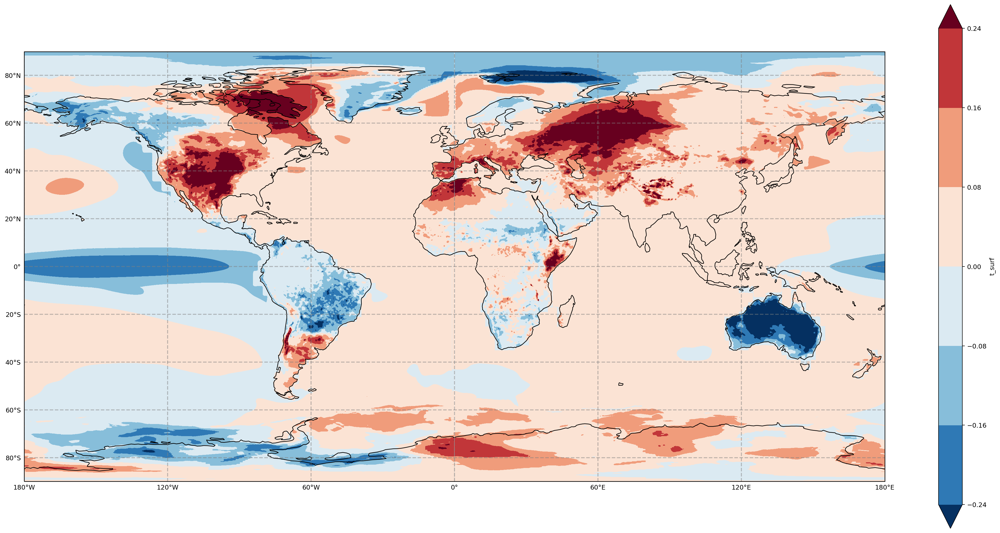

In [18]:
#plot surface temp anomaly
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(tsurf_2x - tsurf_ctl).mean('time').plot.contourf(robust=True,cmap='RdBu_r')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()

#ax1.set_title(f'%s tsurf anomaly (K)'%exp['model'],fontsize=28)

Text(0.5, 1.0, 'AM2.5C360 Jun-Nov wind shear anomaly (m/s)')

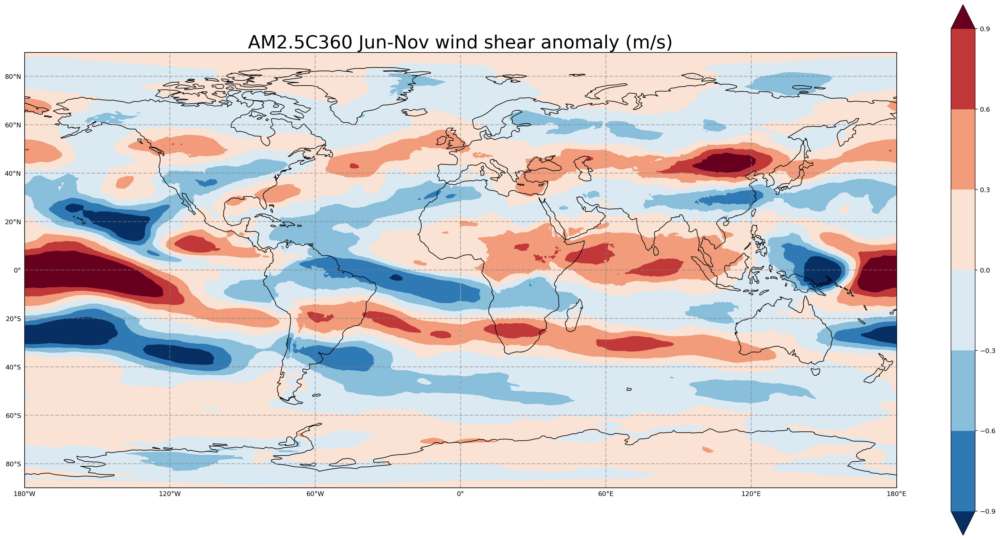

In [19]:
#plot windshear anomaly
plt.figure(figsize=(30,15))
ax1=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(wind_shear_2x - wind_shear_ctl).groupby('time.month').mean('time').sel(month=[6,7,8,9,10,11]).mean('month').plot.contourf(robust=True,cmap='RdBu_r')#,vmin=-0.25,vmax=0.25,levels=11,extend='both')
ax1.add_feature(cfeature.LAND, facecolor='0.75')
gl=ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1.5, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax1.coastlines()
ax1.set_title(f'%s Jun-Nov wind shear anomaly (m/s)'%exp['model'],fontsize=28)
#plt.savefig(f'%s_windshear.png'%exp['model'])

# make dataset of storms & lon/lats 

In [275]:
#this part reshapes the dataset of NA storms (ds_ctl_NA and ds_ctl_2x) and selects the segments of storm tracks
# such that the track begins when the storm has BOTH a warm core AND windspeed above threshold v (which you can set)
# and the track ends when the storm no longer has either (a warm core and winds above v)
# then we save (using pickle) the latitude/longitudes of the tracks, and the winds, as simple arrays
# we also save the storm dataset as .nc
# this part can take a while to run, depending on what data we're using. 

[19.53795658, 27.41317178, 31.81346932, 34.58946454, 37.10547728, 40.25059067]

In [293]:
#windspeed threshhold v (m/s)
v = 0.

# make dataset with vector to cluster by (for this we wanna do locations of: gensis,lysis,and windmax)
count = []
year = []
month = []
lats = []
lons = []

#genesis and lysis are indices of the stage of genesis & lysis 
genesis = []
lysis = []
winds = []
winds_warm = []
lat_gen = []
lon_gen = []
lat_lys = []
lon_lys = []
lat_max = []
lon_max = []
wind_max = []
exp = []
ew_basin = []
n=1
for i in range(len(ds_ctl_NA.year)):
    for ii in range(len(ds_ctl_NA.storm)):
        if not np.isnan(ds_ctl_NA.isel(year=i,storm=ii).lat).all():
            m=0
            ly=0
            for iii in range(len(ds_ctl_NA.stage)):
                if ((m==0) & (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) & (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    genesis.append(iii)
                    m=1
                if ((ds_ctl_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) | (ds_ctl_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    ly=iii
            if m==1:
                lysis.append(ly)
                lat_gen.append(ds_ctl_NA.isel(year=i,storm=ii,stage=genesis[-1]).lat.item())
                lon_gen.append(ds_ctl_NA.isel(year=i,storm=ii,stage=genesis[-1]).lon.item())
                lat_lys.append(ds_ctl_NA.isel(year=i,storm=ii,stage=lysis[-1]).lat.item())
                lon_lys.append(ds_ctl_NA.isel(year=i,storm=ii,stage=lysis[-1]).lon.item())
                count.append(n)
                n+=1
                year.append(ds_ctl_NA.isel(year=i,storm=ii).year.item())
                month.append(ds_ctl_NA.isel(year=i,storm=ii, stage=genesis[-1]).month.item())
                lats.append(ds_ctl_NA.isel(year=i,storm=ii).lat.values.tolist())
                lons.append(ds_ctl_NA.isel(year=i,storm=ii).lon.values.tolist())
                winds.append(ds_ctl_NA.isel(year=i,storm=ii).windmax.values.tolist())
                winds_warm.append(ds_ctl_NA.isel(year=i,storm=ii).windmax.values[ds_ctl_NA.isel(year=i,storm=ii).tm.values>0].tolist())
                lat_max.append(lats[-1][np.nanargmax(winds[-1])])
                lon_max.append(lons[-1][np.nanargmax(winds[-1])])
                wind_max.append(max(winds[-1]))
                exp.append('CTL')


/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in greater


In [294]:
for i in range(len(ds_2x_NA.year)):
    for ii in range(len(ds_2x_NA.storm)):
        if not np.isnan(ds_2x_NA.isel(year=i,storm=ii).lat).all():
            m=0
            ly=0
            for iii in range(len(ds_2x_NA.stage)):
                if ((m==0)&(ds_2x_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) & (ds_2x_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    genesis.append(iii)
                    m=1
                if ((ds_2x_NA.isel(year=i,storm=ii,stage=iii).windmax.item() >v) | (ds_2x_NA.isel(year=i,storm=ii,stage=iii).tm.item() >0.)):
                    ly=iii
            if m==1:
                lysis.append(ly)
                lat_gen.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).lat.item())
                lon_gen.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).lon.item())
                lat_lys.append(ds_2x_NA.isel(year=i,storm=ii,stage=lysis[-1]).lat.item())
                lon_lys.append(ds_2x_NA.isel(year=i,storm=ii,stage=lysis[-1]).lon.item())
                count.append(n)
                n+=1
                year.append(ds_2x_NA.isel(year=i,storm=ii).year.item())
                month.append(ds_2x_NA.isel(year=i,storm=ii,stage=genesis[-1]).month.item())
                lats.append(ds_2x_NA.isel(year=i,storm=ii).lat.values.tolist())
                lons.append(ds_2x_NA.isel(year=i,storm=ii).lon.values.tolist())
                winds.append(ds_2x_NA.isel(year=i,storm=ii).windmax.values.tolist())
                winds_warm.append(ds_2x_NA.isel(year=i,storm=ii).windmax.values[ds_2x_NA.isel(year=i,storm=ii).tm.values>0].tolist())
                lat_max.append(lats[-1][np.nanargmax(winds[-1])])
                lon_max.append(lons[-1][np.nanargmax(winds[-1])])
                wind_max.append(max(winds[-1]))
                exp.append('2X')
               

/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater


In [295]:
# make it into a dataarray
index = list(range(0,len(count)))
Count = xr.DataArray(count, coords=[index], dims=['index'])
Lat_gen = xr.DataArray(lat_gen, coords=[index], dims=['index'])
Lon_gen = xr.DataArray(lon_gen, coords=[index], dims=['index'])
Lat_lys = xr.DataArray(lat_lys, coords=[index], dims=['index'])
Lon_lys = xr.DataArray(lon_lys, coords=[index], dims=['index'])
Lat_max = xr.DataArray(lat_max, coords=[index], dims=['index'])
Lon_max = xr.DataArray(lon_max, coords=[index], dims=['index'])
Wind_max = xr.DataArray(wind_max, coords=[index], dims=['index'])
Genesis = xr.DataArray(genesis, coords=[index], dims=['index'])
Lysis = xr.DataArray(lysis, coords=[index], dims=['index'])
Year = xr.DataArray(year, coords=[index], dims=['index'])
Month =  xr.DataArray(month, coords=[index], dims=['index'])
Experiment = xr.DataArray(exp, coords=[index], dims=['index'])


In [296]:
all_storms_ds = xr.merge([xr.DataArray(Count, name='Count'), xr.DataArray(Lat_gen, name='Lat_gen'), 
                          xr.DataArray(Lon_gen, name='Lon_gen'), xr.DataArray(Lat_lys, name='Lat_lys'), 
                          xr.DataArray(Lon_lys, name='Lon_lys'), xr.DataArray(Lat_max, name='Lat_max'),
                         xr.DataArray(Lon_max, name='Lon_max'),xr.DataArray(Wind_max, name='Wind_max'),xr.DataArray(Genesis, name='Genesis'),xr.DataArray(Lysis, name='Lysis'),xr.DataArray(Year, name='Year'),xr.DataArray(Month, name='Mon'),xr.DataArray(Experiment, name='Experiment')])

In [300]:
exp=model_used
lats_out = open(f'lats_%s_%.1fms.pickle'%(exp['model'],v),'wb')
lons_out = open(f'lons_%s_%.1fms.pickle'%(exp['model'],v),'wb')
winds_out = open(f'winds_%s_%.1fms.pickle'%(exp['model'],v),'wb')
winds_warm_out = open(f'winds_warm_%s_%.1fms.pickle'%(exp['model'],v),'wb')
pickle.dump(lats,lats_out)
pickle.dump(lons,lons_out)
pickle.dump(winds,winds_out)
pickle.dump(winds_warm,winds_warm_out)

In [298]:
## exp=model_used

loc = f'/tigress/tessj/data/%s_all_storms_%.1fms.nc'%(exp['model'],v)
all_storms_ds.to_netcdf(loc)
#all_storms_ds = xr.open_dataset(loc)

# east/west basin storms

In [ ]:
#this section analyzes the storm activity for different wind thresholds v if you split the NA basin at different
# longitude cutoffs and count storms west of these cutoffs

In [15]:
#get lats/lons for storms over threshold v
v=0
lats_in = open(f'lats_%s_%dms.pickle'%(exp['model'],v),'rb')
lons_in = open(f'lons_%s_%dms.pickle'%(exp['model'],v),'rb')
lats = pickle.load(lats_in)
lons = pickle.load(lons_in)

In [17]:
#open allstorms ds created in previous section for v
df_ctl_NA = xr.Dataset.to_dataframe(ds_ctl_NA)
df_2x_NA = xr.Dataset.to_dataframe(ds_2x_NA)

exp=model_used
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%(exp['model'],v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)


In [178]:
#50 YEAR CHUNKS HIRAM ONLY (look at 50 consecutive years)
#all_storms_df = all_storms_df[(all_storms_df.Year>=251)]
#good_indices = list(all_storms_df[all_storms_df.Year>=251].index)
#lats = [lats[i] for i in good_indices]
#lons = [lons[i] for i in good_indices]

In [58]:
#100 YEAR CHUNKS HIRAM ONLY (look at 100 consecutive years)
#all_storms_df = all_storms_df[(all_storms_df.Year>=201)]
#good_indices = list(all_storms_df[all_storms_df.Year>=201].index)
#lats = [lats[i] for i in good_indices]
#lons = [lons[i] for i in good_indices]

In [18]:
#separate lon/lat arrays into ctl and 2x
exp_labels = all_storms_df.Experiment.values.tolist()
lats_ctl=[]
lats_2x=[]
lons_ctl=[]
lons_2x=[]

for i in range(len(lats)):
    if exp_labels[i]=='CTL':
        lats_ctl.append(lats[i])
        lons_ctl.append(lons[i])
    if exp_labels[i]=='2X':
        lats_2x.append(lats[i])
        lons_2x.append(lons[i])

In [196]:
#make list (one for ctl, one for 2x) of number of storms at each lon cutoff
lon_cutoffs = range(270,345)
storms_ctl=[]
storms_2x=[]

#for each lon cutoff, initiate counter at 0
for l in lon_cutoffs:
    total_ctl = 0
    total_2x=0
    #for each storm with a set of lon/lats (ctl)
    for i in range(len(lats_ctl)):
        #get list of indices of longitudes in this storm, count the storm if it has any track latitude north of 17N
        idx = [i for i, val in enumerate(lons_ctl[i]) if val < l] 
        if any(lats_ctl[i][x]>17 for x in idx):
            total_ctl+=1
    storms_ctl.append(total_ctl)
    #same for 2x
    for i in range(len(lats_2x)):
        idx = [i for i, val in enumerate(lons_2x[i]) if val < l] 
        if any(lats_2x[i][x]>17 for x in idx):
            total_2x+=1
    storms_2x.append(total_2x)
            
#make list of percent changes btwn ctl and 2x
storms_per = list((y-x)*100/x for x, y in zip(storms_ctl,storms_2x))

In [198]:
#pickle (save) list of percent changes for model and wind threshold v
storms_per_out = open(f'storms_per_%s_%dms.pickle'%(exp['model'],v),'wb')
pickle.dump(storms_per,storms_per_out)

#pickle twice because sometimes pickle is finnicky for me
storms_per_out = open(f'storms_per_%s_%dms.pickle'%(exp['model'],v),'wb')
pickle.dump(storms_per,storms_per_out)

In [200]:
#open percent changes lists for different models, windspeed cutoffs, years
storms_per_in = open(f'storms_per_HIRAM.pickle','rb') #17ms
storms_per_HIRAM = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms.pickle','rb')
storms_per_HIRAM_15ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_101_151.pickle','rb')
storms_per_HIRAM_15ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_151_201.pickle','rb')
storms_per_HIRAM_15ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_201_251.pickle','rb')
storms_per_HIRAM_15ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_251_301.pickle','rb')
storms_per_HIRAM_15ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_101_201.pickle','rb')
storms_per_HIRAM_15ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_15ms_201_301.pickle','rb')
storms_per_HIRAM_15ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_13ms.pickle','rb')
storms_per_HIRAM_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms.pickle','rb')
storms_per_HIRAM_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_101_151.pickle','rb')
storms_per_HIRAM_20ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_151_201.pickle','rb')
storms_per_HIRAM_20ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_201_251.pickle','rb')
storms_per_HIRAM_20ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_251_301.pickle','rb')
storms_per_HIRAM_20ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_101_201.pickle','rb')
storms_per_HIRAM_20ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_20ms_201_301.pickle','rb')
storms_per_HIRAM_20ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms.pickle','rb')
storms_per_HIRAM_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_101_151.pickle','rb')
storms_per_HIRAM_25ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_151_201.pickle','rb')
storms_per_HIRAM_25ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_201_251.pickle','rb')
storms_per_HIRAM_25ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_251_301.pickle','rb')
storms_per_HIRAM_25ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_101_201.pickle','rb')
storms_per_HIRAM_25ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_25ms_201_301.pickle','rb')
storms_per_HIRAM_25ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms.pickle','rb')
storms_per_HIRAM_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_101_151.pickle','rb')
storms_per_HIRAM_30ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_151_201.pickle','rb')
storms_per_HIRAM_30ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_201_251.pickle','rb')
storms_per_HIRAM_30ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_251_301.pickle','rb')
storms_per_HIRAM_30ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_101_201.pickle','rb')
storms_per_HIRAM_30ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_30ms_201_301.pickle','rb')
storms_per_HIRAM_30ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms.pickle','rb')
storms_per_HIRAM_35ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_101_151.pickle','rb')
storms_per_HIRAM_35ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_151_201.pickle','rb')
storms_per_HIRAM_35ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_201_251.pickle','rb')
storms_per_HIRAM_35ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_251_301.pickle','rb')
storms_per_HIRAM_35ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_101_201.pickle','rb')
storms_per_HIRAM_35ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_35ms_201_301.pickle','rb')
storms_per_HIRAM_35ms_201_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms.pickle','rb')
storms_per_HIRAM_40ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_101_151.pickle','rb')
storms_per_HIRAM_40ms_101_151 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_151_201.pickle','rb')
storms_per_HIRAM_40ms_151_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_201_251.pickle','rb')
storms_per_HIRAM_40ms_201_251 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_251_301.pickle','rb')
storms_per_HIRAM_40ms_251_301 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_101_201.pickle','rb')
storms_per_HIRAM_40ms_101_201 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_40ms_201_301.pickle','rb')
storms_per_HIRAM_40ms_201_301 = pickle.load(storms_per_in)

In [201]:
storms_per_in = open(f'storms_per_AM2.5.pickle','rb')
storms_per_AM25 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_13ms.pickle','rb')
storms_per_AM25_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_17ms.pickle','rb')
storms_per_AM25_17ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_20ms.pickle','rb')
storms_per_AM25_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_25ms.pickle','rb')
storms_per_AM25_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_30ms.pickle','rb')
storms_per_AM25_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5_35ms.pickle','rb')
storms_per_AM25_35ms = pickle.load(storms_per_in)

In [199]:
storms_per_in = open(f'storms_per_AM2.5C360.pickle','rb')
storms_per_AM25C360 = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_15ms.pickle','rb')
storms_per_AM25C360_15ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_13ms.pickle','rb')
storms_per_AM25C360_13ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_20ms.pickle','rb')
storms_per_AM25C360_20ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_25ms.pickle','rb')
storms_per_AM25C360_25ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_30ms.pickle','rb')
storms_per_AM25C360_30ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_35ms.pickle','rb')
storms_per_AM25C360_35ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_40ms.pickle','rb')
storms_per_AM25C360_40ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_45ms.pickle','rb')
storms_per_AM25C360_45ms = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_AM2.5C360_50ms.pickle','rb')
storms_per_AM25C360_50ms = pickle.load(storms_per_in)

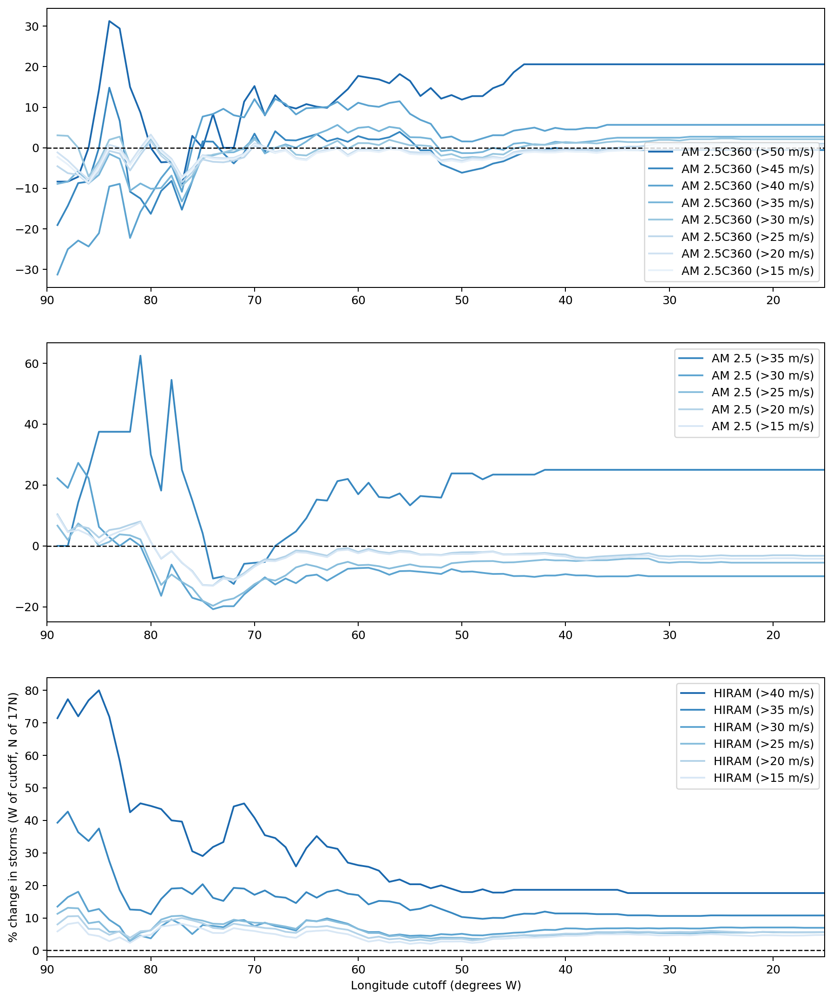

In [207]:
#plot percent changes for each model
import matplotlib as mpl

lon_cutoffs_plot = list(reversed(range(15,90)))


plt.subplots(3,1,figsize=(12,15))

ax1=plt.subplot(3,1,1)
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_50ms, label='AM 2.5C360 (>50 m/s)',c=mpl.cm.Blues(200))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_45ms, label='AM 2.5C360 (>45 m/s)',c=mpl.cm.Blues(170))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_40ms, label='AM 2.5C360 (>40 m/s)',c=mpl.cm.Blues(140))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_35ms, label='AM 2.5C360 (>35 m/s)',c=mpl.cm.Blues(120))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_30ms, label='AM 2.5C360 (>30 m/s)',c=mpl.cm.Blues(100))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_25ms, label='AM 2.5C360 (>25 m/s)',c=mpl.cm.Blues(70))
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_20ms, label='AM 2.5C360 (>20 m/s)',c=mpl.cm.Blues(50))
#ax1.plot(lon_cutoffs_plot,storms_per_AM25C360, label='AM 2.5C360 (>17 m/s)',c='#0000FF')
ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_15ms, label='AM 2.5C360 (>15 m/s)',c=mpl.cm.Blues(20))
#ax1.plot(lon_cutoffs_plot,storms_per_AM25C360_13ms, label='AM 2.5C360 (>13 m/s)',c='#AAAAFF')
ax1.axhline(y=0,linestyle='--',color='k',lw=1)
ax1.set_xlim(90,15)
ax1.legend(loc=4)

ax2=plt.subplot(3,1,3)
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))

ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))

ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
#plt.plot(lon_cutoffs_plot,storms_per_HIRAM,label='HIRAM (>17 m/s)',c='#FF0000')
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
#plt.plot(lon_cutoffs_plot,storms_per_HIRAM_13ms,label='HIRAM (>13 m/s)',c='#FFAAAA')
ax2.axhline(y=0,linestyle='--',color='k',lw=1)
ax2.set_xlim(90,15)
ax2.legend(loc=1)
ax2.set_ylabel('% change in storms (W of cutoff, N of 17N)')
ax2.set_xlabel('Longitude cutoff (degrees W)')

ax3=plt.subplot(3,1,2)
ax3.plot(lon_cutoffs_plot,storms_per_AM25_35ms,label='AM 2.5 (>35 m/s)',c=mpl.cm.Blues(170))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_30ms,label='AM 2.5 (>30 m/s)',c=mpl.cm.Blues(140))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_25ms,label='AM 2.5 (>25 m/s)',c=mpl.cm.Blues(110))
ax3.plot(lon_cutoffs_plot,storms_per_AM25_20ms,label='AM 2.5 (>20 m/s)',c=mpl.cm.Blues(80))
#plt.plot(lon_cutoffs_plot,storms_per_AM25_17ms,label='AM 2.5 (>17 m/s)',c='#00FF00')
ax3.plot(lon_cutoffs_plot,storms_per_AM25,label='AM 2.5 (>15 m/s)',c=mpl.cm.Blues(40))
#plt.plot(lon_cutoffs_plot,storms_per_AM25_13ms,label='AM 2.5 (>13 m/s)',c='#AAFFAA')
ax3.axhline(y=0,linestyle='--',color='k',lw=1)
ax3.set_xlim(90,15)

ax3.legend(loc=1)
#plt.savefig('per_change_lon_cutoff_HIRAM_AM25_C360.png')

Text(0.5, 1.0, '201-300')

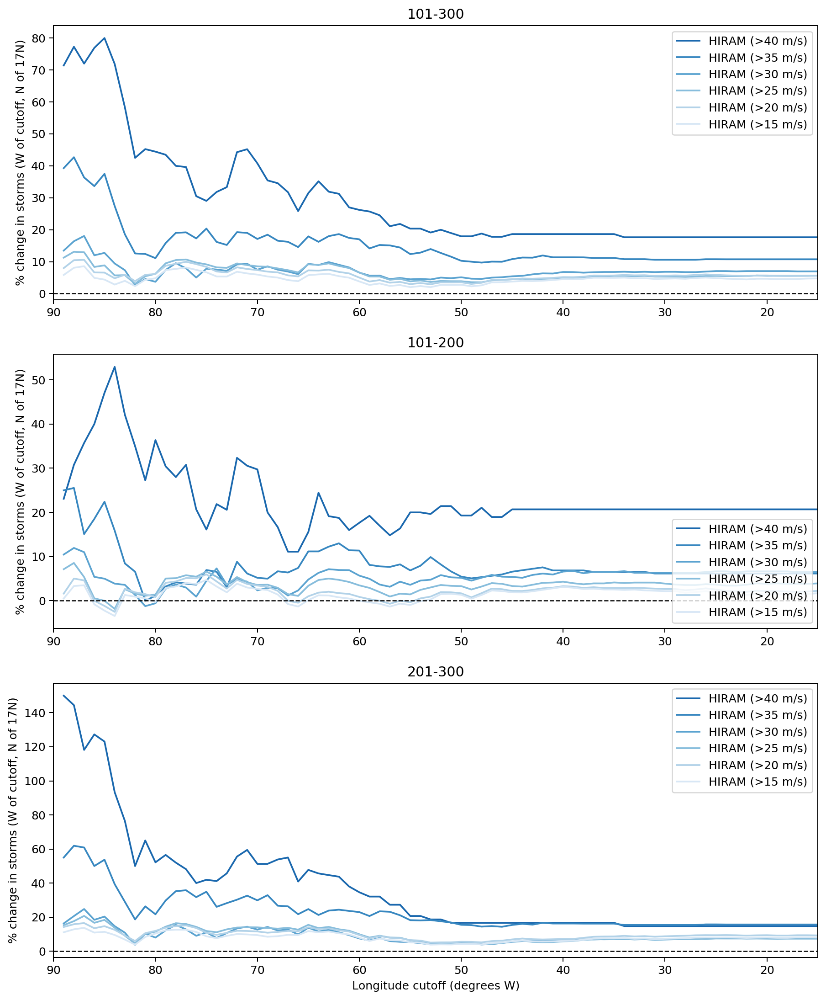

In [204]:
#plot percent changes for different 100 year chunks of HIRAM
lon_cutoffs_plot = list(reversed(range(15,90)))


plt.subplots(3,1,figsize=(12,15))

ax1=plt.subplot(3,1,1)
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax1.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax1.axhline(y=0,linestyle='--',color='k',lw=1)
ax1.set_xlim(90,15)
ax1.legend(loc=1)
ax1.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax1.set_xlabel('Longitude cutoff (degrees W)')
ax1.set_title('101-300')

ax2=plt.subplot(3,1,2)
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_101_201,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_101_201,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_101_201,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_101_201,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_101_201,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax2.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_101_201,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax2.axhline(y=0,linestyle='--',color='k',lw=1)
ax2.set_xlim(90,15)
ax2.legend(loc=4)
ax2.set_ylabel('% change in storms (W of cutoff, N of 17N)')
#ax2.set_xlabel('Longitude cutoff (degrees W)')
ax2.set_title('101-200')

ax3=plt.subplot(3,1,3)
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_40ms_201_301,label='HIRAM (>40 m/s)',c=mpl.cm.Blues(200))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_35ms_201_301,label='HIRAM (>35 m/s)',c=mpl.cm.Blues(170))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_30ms_201_301,label='HIRAM (>30 m/s)',c=mpl.cm.Blues(140))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_25ms_201_301,label='HIRAM (>25 m/s)',c=mpl.cm.Blues(110))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_201_301,label='HIRAM (>20 m/s)',c=mpl.cm.Blues(80))
ax3.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_201_301,label='HIRAM (>15 m/s)',c=mpl.cm.Blues(40))
ax3.axhline(y=0,linestyle='--',color='k',lw=1)
ax3.set_xlim(90,15)
ax3.legend(loc=1)
ax3.set_ylabel('% change in storms (W of cutoff, N of 17N)')
ax3.set_xlabel('Longitude cutoff (degrees W)')
ax3.set_title('201-300')


#plt.savefig('per_change_lon_cutoff_HIRAM_100yrs.png')

In [1]:
#this script used to plot storm tracks west of 60W, but it doesn't run anymore because i changed how i was
# saving storm tracks!
'''
#exp=model_used
fig, axes = plt.subplots(1, 2, figsize=(20,10))
titles = ['North of 17N, West of 60W','Rest of basin']
for ii, ax in enumerate(axes.flat):
    n=1
    ax=plt.subplot(1,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())

    for index, row in e_w[ii].iterrows():
            if e_w[ii].Count[index]>n:
                n = e_w[ii].Count[index]
            if e_w[ii].Count[index]==n:
            #single_hur = e_w[ii][e_w[ii].Count==n]
                g = e_w[ii].Genesis[index]
                l = e_w[ii].Lysis[index]
                if e_w[ii].Experiment[index]=='CTL':
                    plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
                else:
                    plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='r',transform=ccrs.PlateCarree(),lw=.25)

                n += 1
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
    ax.legend(custom_lines, [f'CTL (%d)'%len(e_w[ii][e_w[ii].Experiment=='CTL']), f'2xSST (%d)'%len(e_w[ii][e_w[ii].Experiment=='2X'])],fontsize=20)
    if ii==0:
            custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
            ax.legend(custom_lines, [f'CTL (%d)'%len(e_w[ii][e_w[ii].Experiment=='CTL']), f'2xSST (%d)'%len(e_w[ii][e_w[ii].Experiment=='2X']),'CTL', '2xSST'],fontsize=18)


plt.suptitle(f'%s CTL + 2xSST storms (>17 m/s))'%exp['model'],fontsize=24,y=.9)
#plt.savefig(f'%s_ew.png'%exp['model'])'''

NameError: name 'plt' is not defined

19.53795658

# bootstrap HIRAM

In [ ]:
#do this (100 years) for AM2.5C360 and C180
#21st century projections from RCP8.5 in gabes directory
#repeat this exercise (HIRAM,AM2.5/C360)
#how does the response to the last millennium compare to the response to 21st century & how do the different models work together

In [ ]:
#this section resamples 100 years of HIRAM n number of times, then does the above analysis on each resample

In [248]:
#cutoffs from "intensity mapping" section
HIRAM_cutoffs = [19.53795658,27.41317178,31.81346932,34.58946454,37.10547728,40.25059067]
HIRAM_cutoffs

[19.53795658, 27.41317178, 31.81346932, 34.58946454, 37.10547728, 40.25059067]

In [361]:
#have to run the next few cells to do the bootstrapping for each cutoff you want 
# to look at (all cells until the one that starts storms_per_in =)
# should probably make this into one cell or a for loop

#open lats, lons, allstorms ds
from sklearn.utils import resample

v=HIRAM_cutoffs[5]
lats_in = open(f'lats_%s_%.1fms.pickle'%(exp['model'],v),'rb')
lons_in = open(f'lons_%s_%.1fms.pickle'%(exp['model'],v),'rb')
lats = pickle.load(lats_in)
lons = pickle.load(lons_in)

df_ctl_NA = xr.Dataset.to_dataframe(ds_ctl_NA)
df_2x_NA = xr.Dataset.to_dataframe(ds_2x_NA)

exp=model_used
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%.1fms.nc'%(exp['model'],v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

In [362]:
# number of samples n
# generate list of seed states so that resampling is replicable
n=500
HIRAM_years = list(range(101,301))
seed_states_2x = list(range(n))
seed_states_ctl = list(range(n,n+n))

In [363]:
# resample w replacement 100 years from both 2X and CTL
boot_years_2x = []
boot_years_ctl = []
for i in range(n):
    boot_years_2x.append(resample(HIRAM_years, replace=True, n_samples=100, random_state=seed_states_2x[i]))
    boot_years_ctl.append(resample(HIRAM_years, replace=True, n_samples=100, random_state=seed_states_ctl[i]))

In [364]:
#for each set of 100 years, make df of storms in those 100 years & their lat/lons  
#CTL

lats_ctl=[0 for i in range(n)]
lons_ctl=[0 for i in range(n)]
boot_storms_ctl=[0 for i in range(n)]

# for each of the n sets of 100 years
for iii in range(n):
    #create a list to put the storm dfs and lat/lon lists for each of the n sets
    boot_storms_ctl_list = []
    lons_ctl_list = []
    lats_ctl_list = []
    
    #for each of the 100 years in the set  
    for ii in boot_years_ctl[iii]:
        
        #add the storms from that year to a list of dfs for that set
        boot_storms_ctl_list.append(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == 'CTL'])
        
        #add the lat/lon lists to the list of lat/lons for that set
        lats_ctl_list.extend([lats[i] for i in list(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == 'CTL'].index)])
        lons_ctl_list.extend([lons[i] for i in list(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == 'CTL'].index)])
    
    #concatenate the storms from this set into one df
    boot_storms_ctl[iii] = pd.concat(boot_storms_ctl_list)
    
    #add the big list of lat/lons for that set to the list of lists 
    lats_ctl[iii] = lats_ctl_list
    lons_ctl[iii] = lons_ctl_list

0


/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [365]:
#for each set of 100 years, make df of storms in those 100 years & their lat/lons  
#2x

lats_2x=[0 for i in range(n)]
lons_2x=[0 for i in range(n)]
boot_storms_2x=[0 for i in range(n)]

# for each of the n sets of 100 years
for iii in range(n):
    #create a list to put the storm dfs and lat/lon lists for each of the n sets
    boot_storms_2x_list = []
    lons_2x_list = []
    lats_2x_list = []
    
    #for each of the 100 years in the set  
    for ii in boot_years_2x[iii]:
        
        #add the storms from that year to a list of dfs for that set
        boot_storms_2x_list.append(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == '2X'])
        
        #add the lat/lon lists to the list of lat/lons for that set
        lats_2x_list.extend([lats[i] for i in list(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == '2X'].index)])
        lons_2x_list.extend([lons[i] for i in list(all_storms_df[all_storms_df.Year == ii][all_storms_df.Experiment == '2X'].index)])
    
    #concatenate the storms from this set into one df
    boot_storms_2x[iii] = pd.concat(boot_storms_2x_list)
    
    #add the big list of lat/lons for that set to the list of lists 
    lats_2x[iii] = lats_2x_list
    lons_2x[iii] = lons_2x_list

0


/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/tessj/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [366]:
#calculate percent change in storms 
lon_cutoffs = range(270,345)
boot_nostorms_ctl=[0 for i in range(n)]
boot_nostorms_2x=[0 for i in range(n)]
storms_per=[0 for i in range(n)]

for ii in range(n):
    storms_ctl=[]
    storms_2x=[]
    for l in lon_cutoffs:
        total_ctl = 0
        total_2x=0
        for i in range(len(lats_ctl[ii])):
            idx = [i for i, val in enumerate(lons_ctl[ii][i]) if val < l] 
            if any(lats_ctl[ii][i][x]>17 for x in idx):
                total_ctl+=1
        storms_ctl.append(total_ctl)
        for i in range(len(lats_2x[ii])):
            idx = [i for i, val in enumerate(lons_2x[ii][i]) if val < l] 
            if any(lats_2x[ii][i][x]>17 for x in idx):
                total_2x+=1
        storms_2x.append(total_2x)
    storms_per[ii] = list((y-x)*100/x for x, y in zip(storms_ctl,storms_2x))
    boot_nostorms_ctl[ii]=storms_ctl
    boot_nostorms_2x[ii]=storms_2x
    

In [368]:
#pickle (save) percent change in storms (may have to run this cell more than once!! check to make sure you can open the file)
boot_storms_per_out = open(f'storms_per_%s_%.1fms_boot.pickle'%(exp['model'],v),'wb')
pickle.dump(storms_per,boot_storms_per_out)

In [369]:
#START HERE if already have all the percent change calculations

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[0],'rb')
storms_per_HIRAM_cutoff0_boot = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[1],'rb')
storms_per_HIRAM_cutoff1_boot = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[2],'rb')
storms_per_HIRAM_cutoff2_boot = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[3],'rb')
storms_per_HIRAM_cutoff3_boot = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[4],'rb')
storms_per_HIRAM_cutoff4_boot = pickle.load(storms_per_in)

storms_per_in = open(f'storms_per_HIRAM_%.1fms_boot.pickle'%HIRAM_cutoffs[5],'rb')
storms_per_HIRAM_cutoff5_boot = pickle.load(storms_per_in)


#storms_per_in = open(f'storms_per_HIRAM_20ms_boot.pickle','rb')
#storms_per_HIRAM_20ms_boot = pickle.load(storms_per_in)

Text(0.5, 1.0, '>19.54 m/s HIRAM 100 years, n=500 resamples')

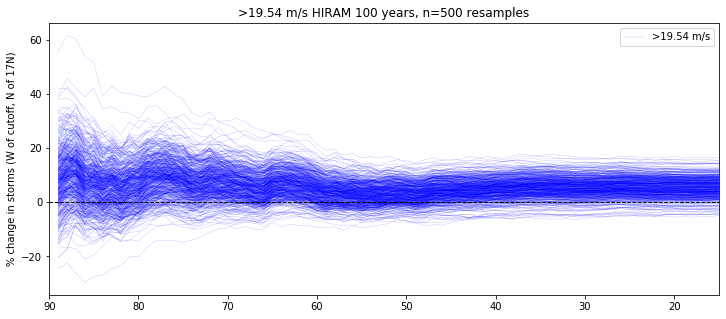

In [328]:
#spaghetti plot of all n resamples at one cutoff v
plt.figure(figsize=(12,5))
lon_cutoffs_plot = list(reversed(range(15,90)))

for i in range(n):
    plt.plot(lon_cutoffs_plot,storms_per_HIRAM_cutoff0_boot[i], color='b',lw=0.1)
    #plt.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_boot[i], color='g')
    if (i==0):
        plt.plot(lon_cutoffs_plot,storms_per_HIRAM_cutoff0_boot[i], color='b', label = f'>%.2f m/s'%HIRAM_cutoffs[0],lw=0.1)
        #plt.plot(lon_cutoffs_plot,storms_per_HIRAM_20ms_boot[i], color='g', label = '>20 m/s')

plt.axhline(y=0,linestyle='--',color='k',lw=1)
plt.xlim(90,15)
plt.ylabel('% change in storms (W of cutoff, N of 17N)')
plt.legend()

plt.title(f'>%.2f m/s HIRAM 100 years, n=500 resamples'%HIRAM_cutoffs[0])

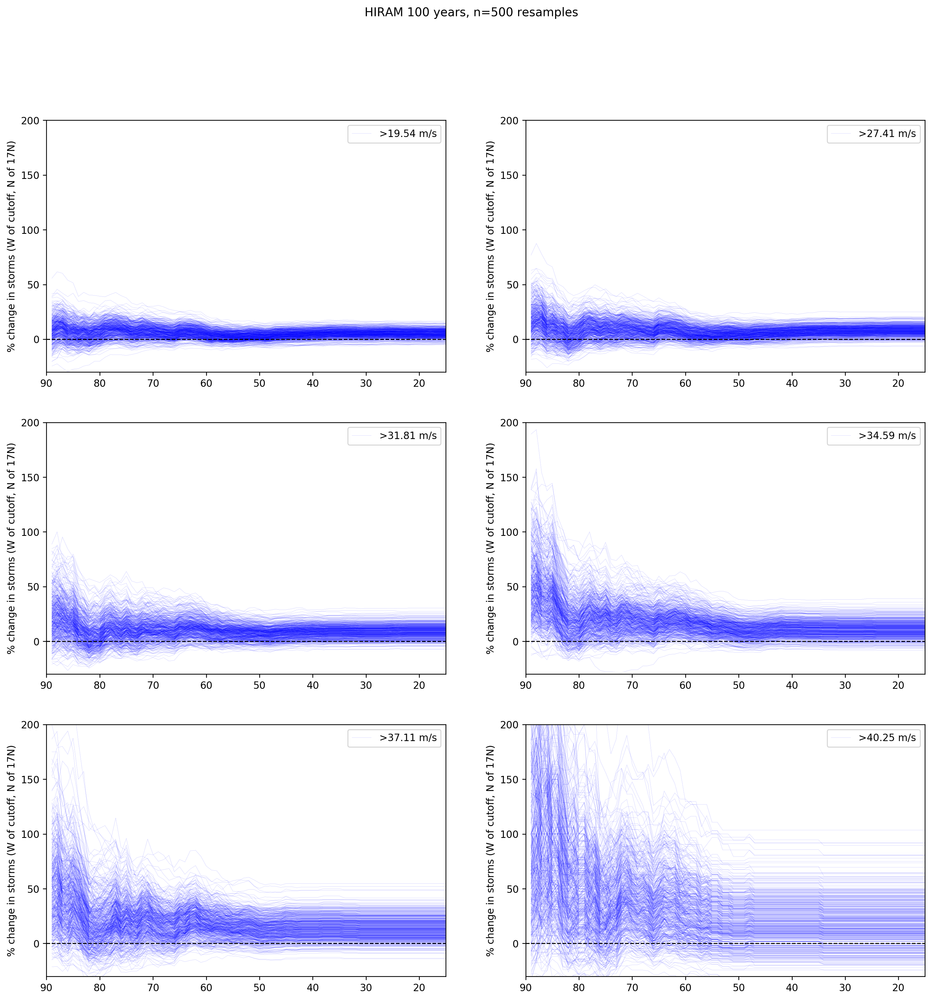

In [385]:
#spaghetti plots of all 6 cutoffs
fig, ax = plt.subplots(3,2,figsize=(16,16))
lon_cutoffs_plot = list(reversed(range(15,90)))
storms_per_HIRAM_cutoffs_boot=[storms_per_HIRAM_cutoff0_boot,storms_per_HIRAM_cutoff1_boot,storms_per_HIRAM_cutoff2_boot,storms_per_HIRAM_cutoff3_boot,storms_per_HIRAM_cutoff4_boot,storms_per_HIRAM_cutoff5_boot]
ax = ax.ravel()

for p in range(6):
    ax[p]=plt.subplot(3,2,p+1)
    for i in range(n):
        ax[p].plot(lon_cutoffs_plot,storms_per_HIRAM_cutoffs_boot[p][i], color='b',lw=0.05)
        if (i==0):
            ax[p].plot(lon_cutoffs_plot,storms_per_HIRAM_cutoffs_boot[p][i], color='b', label = f'>%.2f m/s'%HIRAM_cutoffs[p],lw=0.05)

    ax[p].axhline(y=0,linestyle='--',color='k',lw=1)
    ax[p].set_xlim(90,15)
    ax[p].set_ylim(-30,200)
    ax[p].set_ylabel('% change in storms (W of cutoff, N of 17N)')
    ax[p].legend()

plt.suptitle('HIRAM 100 years, n=500 resamples')
plt.savefig('HIRAM_boot_100yr_n500.png')

Text(0.5, 1.0, 'HIRAM 100 years, n=5 resamples, >15m/s')

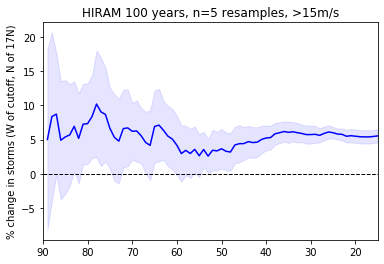

In [233]:
# average of above plot for one wind cutoff, with z test 95% confidence intervals
storms_per_HIRAM_15ms_boot_ar = np.array(storms_per_HIRAM_15ms_boot)
storms_per_HIRAM_15ms_boot_mean = np.mean(storms_per_HIRAM_15ms_boot_ar,axis=0)
storms_per_HIRAM_15ms_boot_std = np.std(storms_per_HIRAM_15ms_boot_ar, axis=0)

Z = 1.960 #z-test

plt.plot(lon_cutoffs_plot,storms_per_HIRAM_15ms_boot_mean, color='b')
plt.fill_between(lon_cutoffs_plot,
        storms_per_HIRAM_15ms_boot_mean - (Z * storms_per_HIRAM_15ms_boot_std / np.sqrt(n)),
        storms_per_HIRAM_15ms_boot_mean + (Z * storms_per_HIRAM_15ms_boot_std / np.sqrt(n)),
        color='b', alpha=0.1)
plt.axhline(y=0,linestyle='--',color='k',lw=1)
plt.xlim(90,15)
plt.ylabel('% change in storms (W of cutoff, N of 17N)')
plt.title('HIRAM 100 years, n=5 resamples, >15m/s')

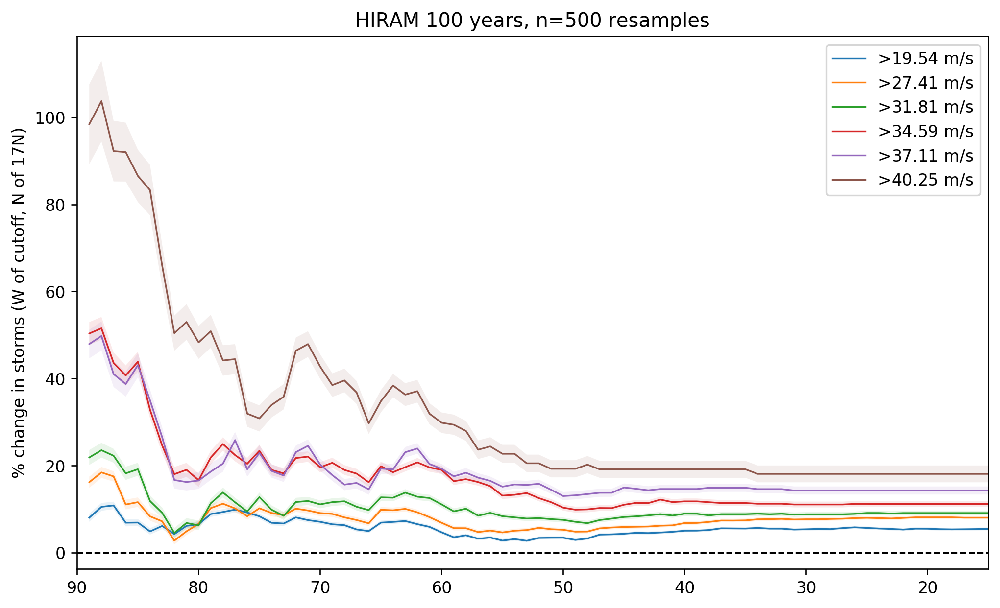

In [397]:
# plot means for all 6 windspeed thresholds with 95% CI 
plt.figure(figsize=(10,6))
Z = 1.960 #z-test
storms_per_HIRAM_cutoffs_boot_ar=[np.array(item) for item in storms_per_HIRAM_cutoffs_boot]
storms_per_HIRAM_cutoffs_boot_mean=[np.mean(item,axis=0)for item in storms_per_HIRAM_cutoffs_boot_ar]
storms_per_HIRAM_cutoffs_boot_std=[np.std(item,axis=0)for item in storms_per_HIRAM_cutoffs_boot_ar]

for p in range(6):
    plt.plot(lon_cutoffs_plot,storms_per_HIRAM_cutoffs_boot_mean[p],label=f'>%.2f m/s'%HIRAM_cutoffs[p],lw=1)
    plt.fill_between(lon_cutoffs_plot,
            storms_per_HIRAM_cutoffs_boot_mean[p] - (Z * storms_per_HIRAM_cutoffs_boot_std[p] / np.sqrt(n)),
            storms_per_HIRAM_cutoffs_boot_mean[p] + (Z * storms_per_HIRAM_cutoffs_boot_std[p] / np.sqrt(n)), alpha=0.1)
    
plt.axhline(y=0,linestyle='--',color='k',lw=1)
plt.xlim(90,15)
plt.ylabel('% change in storms (W of cutoff, N of 17N)')
plt.title('HIRAM 100 years, n=500 resamples')
plt.legend()
#plt.savefig('HIRAM_boot_100yr_n500_means.png')

# clustering

In [ ]:
#k-means clustering storms by genesis/lysis/maximum wind location

In [ ]:
v=15
lats_in = open(f'lats_%s_%dms.pickle'%(exp['model'],v),'rb')
lons_in = open(f'lons_%s_%dms.pickle'%(exp['model'],v),'rb')
lats = pickle.load(lats_in)
lons = pickle.load(lons_in)

In [ ]:
df_ctl_NA = xr.Dataset.to_dataframe(ds_ctl_NA)
df_2x_NA = xr.Dataset.to_dataframe(ds_2x_NA)

exp=model_used
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%(exp['model'],v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)


In [ ]:
#Make a copy of DF
all_storms_df_cp = all_storms_df
k=5

#Standardize
clmns = ['Lat_gen', 'Lon_gen','Lat_lys', 'Lon_lys', 'Lat_max', 'Lon_max']
all_storms_df_cp_std = stats.zscore(all_storms_df_cp[clmns])

#Cluster the data
kmeans = KMeans(n_clusters=k, random_state=0).fit(all_storms_df_cp_std)
labels = kmeans.labels_

#Glue back to originaal data
all_storms_df_cp['clusters'] = labels

#Add the column into our list
clmns.extend(['clusters'])

all_storms_df_cp

In [ ]:
#get means of each cluster 
centers = all_storms_df_cp[clmns].groupby(['clusters']).mean()
centers_ctl = all_storms_df_cp[all_storms_df_cp['Experiment']=='CTL'][clmns].groupby(['clusters']).mean()
centers_2x = all_storms_df_cp[all_storms_df_cp['Experiment']=='2X'][clmns].groupby(['clusters']).mean()
centers_2x

In [ ]:
#separate clusters into their own dataframes
clusters = []
for i in range(k):
    clusters.append(all_storms_df[all_storms_df.clusters==i])

In [ ]:
#plot locations of gen, max winds, lysis by cluster
fig, axes = plt.subplots(1, 3, figsize=(20,8))
titles = ['Genesis','Max Wind', 'Lysis']
colors = ['b','orange','g','firebrick','violet']
varnames = [['Lon_gen','Lat_gen'],['Lon_max','Lat_max'],['Lon_lys','Lat_lys']]

for ii, ax in enumerate(axes.flat):
    ax=plt.subplot(1,3,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, -15, 0, 70], ccrs.PlateCarree())
    for i in range(len(clusters)):
        plt.scatter(clusters[i][varnames[ii][0]],clusters[i][varnames[ii][1]],color=colors[i],s=5,transform=ccrs.PlateCarree())
    plt.title(titles[ii])
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 

plt.suptitle(f'%s CTL + 2xSST storm clusters'%exp['model'],fontsize=24,y=.85)

In [ ]:
# plot cluster tracks in subplots with storm counts in each cluster in legend
#exp=model_used
fig, axes = plt.subplots(3, 2, figsize=(20,20))
titles = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5']
for ii, ax in enumerate(axes.flat):
    if ii==5:
        break
    n=1
    ax=plt.subplot(3,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
    for index, row in clusters[ii].iterrows():
        if clusters[ii].Count[index]>n:
            n = clusters[ii].Count[index]
        if clusters[ii].Count[index]==n:

            g = clusters[ii].Genesis[index]
            l = clusters[ii].Lysis[index]
            if clusters[ii].Experiment[index]=='CTL':
                plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
            else:
                plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='r',transform=ccrs.PlateCarree(),lw=.25)

            n += 1
    x, y = [centers_ctl.Lon_gen[ii], centers_ctl.Lon_max[ii], centers_ctl.Lon_lys[ii]], [centers_ctl.Lat_gen[ii], centers_ctl.Lat_max[ii], centers_ctl.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=1,linestyle=':')
    x, y = [centers_2x.Lon_gen[ii], centers_2x.Lon_max[ii], centers_2x.Lon_lys[ii]], [centers_2x.Lat_gen[ii], centers_2x.Lat_max[ii], centers_2x.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=1,linestyle='--')
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2)]
    ax.legend(custom_lines, [f'CTL (%d)'%len(clusters[ii][clusters[ii].Experiment=='CTL']), f'2xSST (%d)'%len(clusters[ii][clusters[ii].Experiment=='2X'])],fontsize=20)
    if ii==0:
            custom_lines = [Line2D([0], [0], color='b', lw=2), Line2D([0], [0], color='r', lw=2),Line2D([0], [0], color='k', lw=2,linestyle=':'), Line2D([0], [0], color='k', lw=2,linestyle='--')]
            ax.legend(custom_lines, [f'CTL (%d)'%len(clusters[ii][clusters[ii].Experiment=='CTL']), f'2xSST (%d)'%len(clusters[ii][clusters[ii].Experiment=='2X']),'CTL', '2xSST'],fontsize=18)

fig.delaxes(ax= axes[2,1])

plt.suptitle(f'%s CTL + 2xSST storm (>15 m/s) clusters (Location of genesis, windmax, lysis)'%exp['model'],fontsize=24)

plt.savefig(f'%s_5clusters_15ms.png'%exp['model'])

## HURDAT clustering

In [ ]:
# clustering as above but for HURDAT2 observations

In [337]:

hurdat=xr.open_dataset('/tigress/tessj/data/hurdat2_atlantic.nc')
# keep entries w/ wind >= 33kts
hurdat=xr.Dataset.to_dataframe(hurdat)
for i in range(int(max(hurdat.Count))):
    if (len(hurdat[hurdat.Count==i])<8):
        hurdat=hurdat[hurdat.Count!=i]
hurdat_cluster=hurdat[hurdat.Wind >= 33]
# create datetime column
time = []
for year, month, day, hour, minute, long in zip(hurdat_cluster.Year.values, hurdat_cluster.Month.values, hurdat_cluster.Day.values, hurdat_cluster.Hour.values, hurdat_cluster.Minute.values, hurdat_cluster.Longitude.values):
    year = str(int(year))
    month = str(int(month)).zfill(2)
    day = str(int(day)).zfill(2)
    hour = str(int(hour)).zfill(2)
    minute = str(int(minute)).zfill(2)
    dt = datetime.strptime(year+month+day+hour+minute,'%Y%m%d%H%M')
    time.append(dt)
index = hurdat_cluster.index
time = xr.DataArray(time, coords=[index], dims=['index'])
hurdat_cluster=hurdat_cluster.to_xarray()
hurdat_cluster = xr.merge([hurdat_cluster,xr.DataArray(time, name='Time')])
hurdat_cluster=xr.Dataset.to_dataframe(hurdat_cluster)

In [38]:
hurdat_cluster = hurdat_cluster.rename(columns={'Latitude': 'Latitude_Gen', 'Longitude': 'Longitude_Gen'})
# make dataset with storm count, genesis lat/long, lysis lat/long, max wind lat/long, max wind value
count = []
lat_gen = []
long_gen = []
lat_lys = []
long_lys = []
lat_max = []
long_max = []
wind_max=[]
year = []
n = 1
hurdat_cluster = hurdat_cluster.reset_index(drop=True)
for index, row in hurdat_cluster.iterrows():
    if hurdat_cluster.Count[index]==n:
        hurdat_single = hurdat_cluster[hurdat_cluster.Count==n]
        count.append(hurdat_single.Count.iat[0])
        lat_gen.append(hurdat_single.Latitude_Gen.iat[0])
        long_gen.append(hurdat_single.Longitude_Gen.iat[0])
        lat_lys.append(hurdat_single.Latitude_Gen.iat[-1])
        long_lys.append(hurdat_single.Longitude_Gen.iat[-1])
        i = hurdat_single['Wind'].idxmax()
        wind_max.append(hurdat_cluster.Wind.iat[i])
        lat_max.append(hurdat_cluster.Latitude_Gen.iat[i])
        long_max.append(hurdat_cluster.Longitude_Gen.iat[i])
        year.append(hurdat_single.Year.iat[0])
        n += 1
    if not (n in hurdat_cluster.Count.values):
        n += 1
index = list(range(0,len(count)))
Count = xr.DataArray(count, coords=[index], dims=['index'])
Lat_gen = xr.DataArray(lat_gen, coords=[index], dims=['index'])
Long_gen = xr.DataArray(long_gen, coords=[index], dims=['index'])
Lat_lys = xr.DataArray(lat_lys, coords=[index], dims=['index'])
Long_lys = xr.DataArray(long_lys, coords=[index], dims=['index'])
Lat_max = xr.DataArray(lat_max, coords=[index], dims=['index'])
Long_max = xr.DataArray(long_max, coords=[index], dims=['index'])
Wind_max = xr.DataArray(wind_max, coords=[index], dims=['index'])
Year = xr.DataArray(year, coords=[index], dims=['index'])

hurdat_storms = xr.merge([xr.DataArray(Count, name='Count'), xr.DataArray(Lat_gen, name='Lat_gen'), 
                          xr.DataArray(Long_gen, name='Long_gen'), xr.DataArray(Lat_lys, name='Lat_lys'), 
                          xr.DataArray(Long_lys, name='Long_lys'), xr.DataArray(Lat_max, name='Lat_max'),
                         xr.DataArray(Long_max, name='Long_max'),xr.DataArray(Wind_max, name='Wind_max'),xr.DataArray(Year, name='Year')])
                          
hurdat_storms = xr.Dataset.to_dataframe(hurdat_storms)

                          

In [ ]:
#Make a copy of DF
hurdat_storms_tr = hurdat_storms

#Standardize
clmns = ['Lat_gen', 'Long_gen','Lat_lys', 'Long_lys', 'Lat_max', 'Long_max']
hurdat_storms_tr_std = stats.zscore(hurdat_storms_tr[clmns])

#Cluster the data
kmeans = KMeans(n_clusters=5, random_state=0).fit(hurdat_storms_tr_std)
labels = kmeans.labels_

#Glue back to originaal data
hurdat_storms_tr['clusters'] = labels

#Add the column into our list
clmns.extend(['clusters'])

In [ ]:
#separate clusters into their own dataframes
clusters_hurdat = []
for i in range(5):
    clusters_hurdat.append(hurdat_storms[hurdat_storms.clusters==i])

In [ ]:

fig, axes = plt.subplots(1, 3, figsize=(20,8))
titles = ['Genesis','Max Wind', 'Lysis']
colors = ['b','orange','g','firebrick','violet']
varnames = [['Long_gen','Lat_gen'],['Long_max','Lat_max'],['Long_lys','Lat_lys']]

for ii, ax in enumerate(axes.flat):
    ax=plt.subplot(1,3,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, -15, 0, 70], ccrs.PlateCarree())
    for i in range(len(clusters_hurdat)):
        plt.scatter(clusters_hurdat[i][varnames[ii][0]],clusters_hurdat[i][varnames[ii][1]],color=colors[i],s=5,transform=ccrs.PlateCarree())
    plt.title(titles[ii])
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 

plt.suptitle('HURDAT2 5 clusters',fontsize=24,y=.85)

In [ ]:
centers_hurdat = hurdat_storms_tr[clmns].groupby(['clusters']).mean()
centers_hurdat

In [ ]:
#exp=model_used
fig, axes = plt.subplots(3, 2, figsize=(20,20))
titles = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4','Cluster 5']
for ii, ax in enumerate(axes.flat):
    if ii==5:
        break
    n=1
    ax=plt.subplot(3,2,ii+1,projection=ccrs.PlateCarree())
    ax.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
    for index, row in clusters_hurdat[ii].iterrows():
        #print(index)
        if clusters_hurdat[ii].Count[index]>n:
            #print(n)
            n = clusters_hurdat[ii].Count[index]
        if clusters_hurdat[ii].Count[index]==n:
            #single_hur = clusters_hurdat[ii][clusters_hurdat[ii].Count==n]
            #g = clusters_hurdat[ii].Genesis[index]
            #l = clusters_hurdat[ii].Lysis[index]
            #if clusters_hurdat[ii].Experiment[index]=='CTL':
            plt.plot(hurdat_cluster[hurdat_cluster.Count == n].Longitude_Gen,hurdat_cluster[hurdat_cluster.Count == n].Latitude_Gen,color='maroon',transform=ccrs.PlateCarree(),lw=.25)
                #plt.plot(lons[index][g:l+1],lats[index][g:l+1],color='b',transform=ccrs.PlateCarree(),lw=.25)
            #else:
            n += 1
    x, y = [centers_hurdat.Long_gen[ii], centers_hurdat.Long_max[ii], centers_hurdat.Long_lys[ii]], [centers_hurdat.Lat_gen[ii], centers_hurdat.Lat_max[ii], centers_hurdat.Lat_lys[ii]]
    plt.plot(x, y, transform=ccrs.PlateCarree(),color='k',linewidth=2)
    plt.title(titles[ii],fontsize=20)
    gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top=False
    gl.ylabels_right=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    ax.add_feature(cfeature.LAND, facecolor='0.75')
    ax.coastlines() 
    custom_lines = [Line2D([0], [0], color='maroon', lw=2)]
    ax.legend(custom_lines, [f'%s (%d)'%(titles[ii],len(clusters_hurdat[ii]))],fontsize=20)

fig.delaxes(ax= axes[2,1])

plt.suptitle('HURDAT2 1851-2018 (>17 m/s) clusters (Location of genesis, windmax, lysis) (1562 total)',fontsize=24)

#plt.savefig('hurdat2_5clusters.png')

# Intensity mapping

In [ ]:
# use PDFs of storms from different models' CTL runs to correct for different models' abilities to 
# represent higher intensity TCs, calculate equivalents of different Saffir-Simpson cutoffs

## lifetime wind max

In [ ]:
#here we look at the lifetime maximum windspeed of each STORM as one data point

In [215]:
# reshape HURDAT data to be more useful
hurdat=xr.open_dataset('/tigress/tessj/data/hurdat2_atlantic.nc')
hurdat=xr.Dataset.to_dataframe(hurdat)
for i in range(int(max(hurdat.Count))):
    if (len(hurdat[hurdat.Count==i])<8):
        hurdat=hurdat[hurdat.Count!=i]
hurdat_cluster=hurdat[hurdat.Wind >= 0]
# create datetime column
time = []
for year, month, day, hour, minute, long in zip(hurdat_cluster.Year.values, hurdat_cluster.Month.values, hurdat_cluster.Day.values, hurdat_cluster.Hour.values, hurdat_cluster.Minute.values, hurdat_cluster.Longitude.values):
    year = str(int(year))
    month = str(int(month)).zfill(2)
    day = str(int(day)).zfill(2)
    hour = str(int(hour)).zfill(2)
    minute = str(int(minute)).zfill(2)
    dt = datetime.strptime(year+month+day+hour+minute,'%Y%m%d%H%M')
    time.append(dt)
index = hurdat_cluster.index
time = xr.DataArray(time, coords=[index], dims=['index'])
hurdat_cluster=hurdat_cluster.to_xarray()
hurdat_cluster = xr.merge([hurdat_cluster,xr.DataArray(time, name='Time')])
hurdat_cluster=xr.Dataset.to_dataframe(hurdat_cluster)

In [216]:
hurdat_cluster = hurdat_cluster.rename(columns={'Latitude': 'Latitude_Gen', 'Longitude': 'Longitude_Gen'})
# make dataset with storm count, genesis lat/long, lysis lat/long, max wind lat/long, max wind value
count = []
lat_gen = []
long_gen = []
lat_lys = []
long_lys = []
lat_max = []
long_max = []
wind_max=[]
year = []
n = 1
hurdat_cluster = hurdat_cluster.reset_index(drop=True)
for index, row in hurdat_cluster.iterrows():
    if hurdat_cluster.Count[index]==n:
        hurdat_single = hurdat_cluster[hurdat_cluster.Count==n]
        count.append(hurdat_single.Count.iat[0])
        lat_gen.append(hurdat_single.Latitude_Gen.iat[0])
        long_gen.append(hurdat_single.Longitude_Gen.iat[0])
        lat_lys.append(hurdat_single.Latitude_Gen.iat[-1])
        long_lys.append(hurdat_single.Longitude_Gen.iat[-1])
        i = hurdat_single['Wind'].idxmax()
        wind_max.append(0.514444*(hurdat_cluster.Wind.iat[i])) #knots to m/s 0.514444*
        lat_max.append(hurdat_cluster.Latitude_Gen.iat[i])
        long_max.append(hurdat_cluster.Longitude_Gen.iat[i])
        year.append(hurdat_single.Year.iat[0])
        n += 1
    if not (n in hurdat_cluster.Count.values):
        n += 1
index = list(range(0,len(count)))
Count = xr.DataArray(count, coords=[index], dims=['index'])
Lat_gen = xr.DataArray(lat_gen, coords=[index], dims=['index'])
Long_gen = xr.DataArray(long_gen, coords=[index], dims=['index'])
Lat_lys = xr.DataArray(lat_lys, coords=[index], dims=['index'])
Long_lys = xr.DataArray(long_lys, coords=[index], dims=['index'])
Lat_max = xr.DataArray(lat_max, coords=[index], dims=['index'])
Long_max = xr.DataArray(long_max, coords=[index], dims=['index'])
Wind_max = xr.DataArray(wind_max, coords=[index], dims=['index'])
Year = xr.DataArray(year, coords=[index], dims=['index'])

hurdat_storms = xr.merge([xr.DataArray(Count, name='Count'), xr.DataArray(Lat_gen, name='Lat_gen'), 
                          xr.DataArray(Long_gen, name='Long_gen'), xr.DataArray(Lat_lys, name='Lat_lys'), 
                          xr.DataArray(Long_lys, name='Long_lys'), xr.DataArray(Lat_max, name='Lat_max'),
                         xr.DataArray(Long_max, name='Long_max'),xr.DataArray(Wind_max, name='Wind_max'),xr.DataArray(Year, name='Year')])
                          
hurdat_storms = xr.Dataset.to_dataframe(hurdat_storms)

                          

In [217]:
# calculate probability of exceedence (POE, essentially a CDF) for each windspeed for each model
v = 0.
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('HIRAM',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='CTL']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
HIRAM_POE = all_storms_df_ctl['POE']
HIRAM_wind_max = all_storms_df_ctl['Wind_max']


all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='CTL']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
AM25_POE = all_storms_df_ctl['POE']
AM25_wind_max = all_storms_df_ctl['Wind_max']


all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5C360',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='CTL']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
AM25C360_POE = all_storms_df_ctl['POE']
AM25C360_wind_max = all_storms_df_ctl['Wind_max']


In [218]:
# calculate POE for HURDAT storms
hurdat_storms['Wind_rank']=hurdat_storms['Wind_max'].rank(ascending=False)
rank_max = hurdat_storms['Wind_rank'].max()
hurdat_storms['POE']=hurdat_storms['Wind_rank']/(rank_max+1)

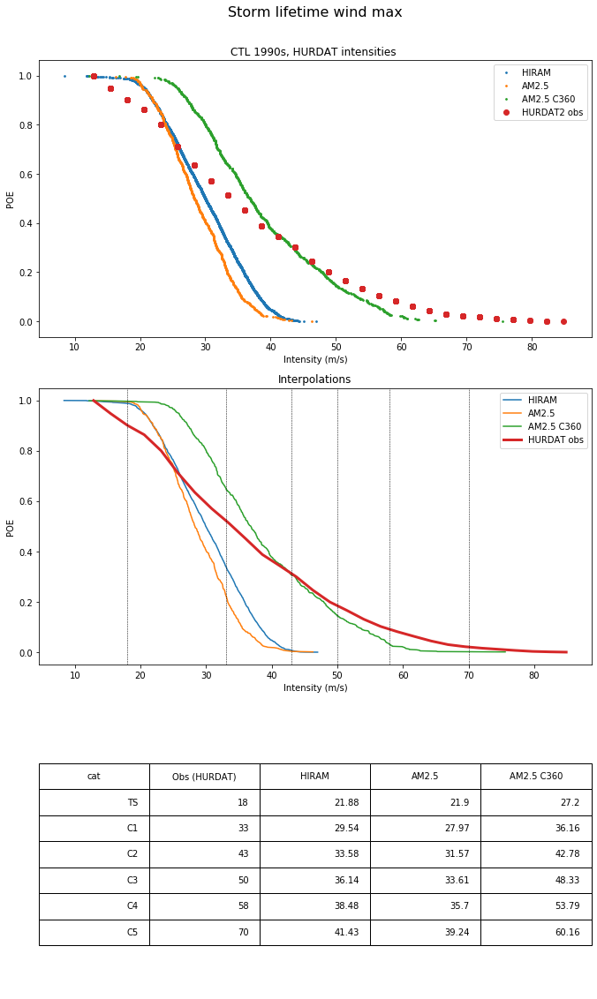

In [221]:
plt.subplots(3,1,figsize=(10,16))

#plot POEs together
ax1=plt.subplot(3,1,1)
ax1.scatter(HIRAM_wind_max,HIRAM_POE,label='HIRAM',s=3)
ax1.scatter(AM25_wind_max,AM25_POE,label='AM2.5',s=3)
ax1.scatter(AM25C360_wind_max,AM25C360_POE,label='AM2.5 C360',s=3)
ax1.scatter(hurdat_storms['Wind_max'],hurdat_storms['POE'],label='HURDAT2 obs')
ax1.set_xlabel('Intensity (m/s)')
ax1.set_ylabel('POE')
ax1.legend()
ax1.set_title('CTL 1990s, HURDAT intensities ')


#interpolate the POEs into a function, also interpolate the inverse a function
ax2=plt.subplot(3,1,2)

u,idx = np.unique(np.array(HIRAM_POE), return_index=True)
f_HIRAM = interp1d(np.unique(HIRAM_wind_max),u[np.argsort(idx)], kind='cubic')
f_HIRAM_inv = interp1d(u[np.argsort(idx)], np.unique(HIRAM_wind_max),kind='cubic')

ax2.plot(HIRAM_wind_max,f_HIRAM(HIRAM_wind_max),label='HIRAM')

u,idx = np.unique(np.array(AM25_POE), return_index=True)
f_AM25 = interp1d(np.unique(AM25_wind_max),u[np.argsort(idx)], kind='cubic')
f_AM25_inv = interp1d(u[np.argsort(idx)], np.unique(AM25_wind_max),kind='cubic')
ax2.plot(AM25_wind_max,f_AM25(AM25_wind_max),label='AM2.5')

u,idx = np.unique(np.array(AM25C360_POE), return_index=True)
f_AM25C360 = interp1d(np.unique(AM25C360_wind_max),u[np.argsort(idx)], kind='cubic')
f_AM25C360_inv = interp1d(u[np.argsort(idx)], np.unique(AM25C360_wind_max),kind='cubic')
ax2.plot(AM25C360_wind_max,f_AM25C360(AM25C360_wind_max),label='AM2.5 C360')

hurdat_storms_sorted=hurdat_storms.sort_values('Wind_max')
u , idx = np.unique(np.array(hurdat_storms_sorted['POE']),return_index=True)
POEs = u[np.argsort(idx)]
f_hurdat = interp1d(np.unique(np.array(hurdat_storms_sorted['Wind_max'])),POEs, kind='cubic')
ax2.plot(hurdat_storms_sorted['Wind_max'],f_hurdat(hurdat_storms_sorted['Wind_max']),label='HURDAT obs',lw=3)

ax2.axvline(18,lw=0.5,ls='--',c='k')
ax2.axvline(33,lw=0.5,ls='--',c='k')
ax2.axvline(43,lw=0.5,ls='--',c='k')
ax2.axvline(50,lw=0.5,ls='--',c='k')
ax2.axvline(58,lw=0.5,ls='--',c='k')
ax2.axvline(70,lw=0.5,ls='--',c='k')

ax2.set_title('Interpolations')
ax2.set_xlabel('Intensity (m/s)')
ax2.set_ylabel('POE')

ax2.legend()

#use inverted function to find equivalents to HURDAT cutoffs (saffir-simpson)
# e.g., TS cutoff is <18m/s, so we find the POE of 18m/s for HURDAT, and then find the 
# windspeed with that same POE for the other models
# insert the conversion table as subplot
ax3=plt.subplot(3,1,3)

labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)


ax3.axis('off')

tab = ax3.table(cellText=cutoffs_df.values, colLabels=cutoffs_df.columns, loc='center')
tab.scale(1,2)

plt.tight_layout(rect=[0, 0, .95, .95])

plt.suptitle('Storm lifetime wind max',fontsize=16)
#plt.savefig('POE_intensity_ctl_lifetime.png')


In [312]:
#same as subplot 3 in previous cell 

labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)

cutoffs_df

,cat,Obs (HURDAT),HIRAM,AM2.5,AM2.5 C360
0,TS,17,21.53,21.48,26.70
1,C1,32,29.17,27.68,35.70
2,C2,42,33.17,31.33,42.11
3,C3,49,35.90,33.34,47.98
4,C4,58,38.48,35.70,53.79
5,C5,70,41.43,39.24,60.16


In [326]:
#next two cells are my attempt to do the same thing with delta POE (2X-ctl)
v = 0.
all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('HIRAM',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='2X']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
HIRAM_POE = all_storms_df_ctl['POE']
HIRAM_wind_max = all_storms_df_ctl['Wind_max']


all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='2X']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
AM25_POE = all_storms_df_ctl['POE']
AM25_wind_max = all_storms_df_ctl['Wind_max']


all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5C360',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)
all_storms_df_ctl = all_storms_df[all_storms_df.Experiment=='2X']
all_storms_df_ctl=all_storms_df_ctl[~np.isnan(all_storms_df_ctl['Wind_max'])]
all_storms_df_ctl= all_storms_df_ctl.sort_values('Wind_max')
all_storms_df_ctl['Wind_rank']=all_storms_df_ctl['Wind_max'].rank(ascending=False)
rank_max = all_storms_df_ctl['Wind_rank'].max()
all_storms_df_ctl['POE']=all_storms_df_ctl['Wind_rank']/(rank_max+1)
AM25C360_POE = all_storms_df_ctl['POE']
AM25C360_wind_max = all_storms_df_ctl['Wind_max']


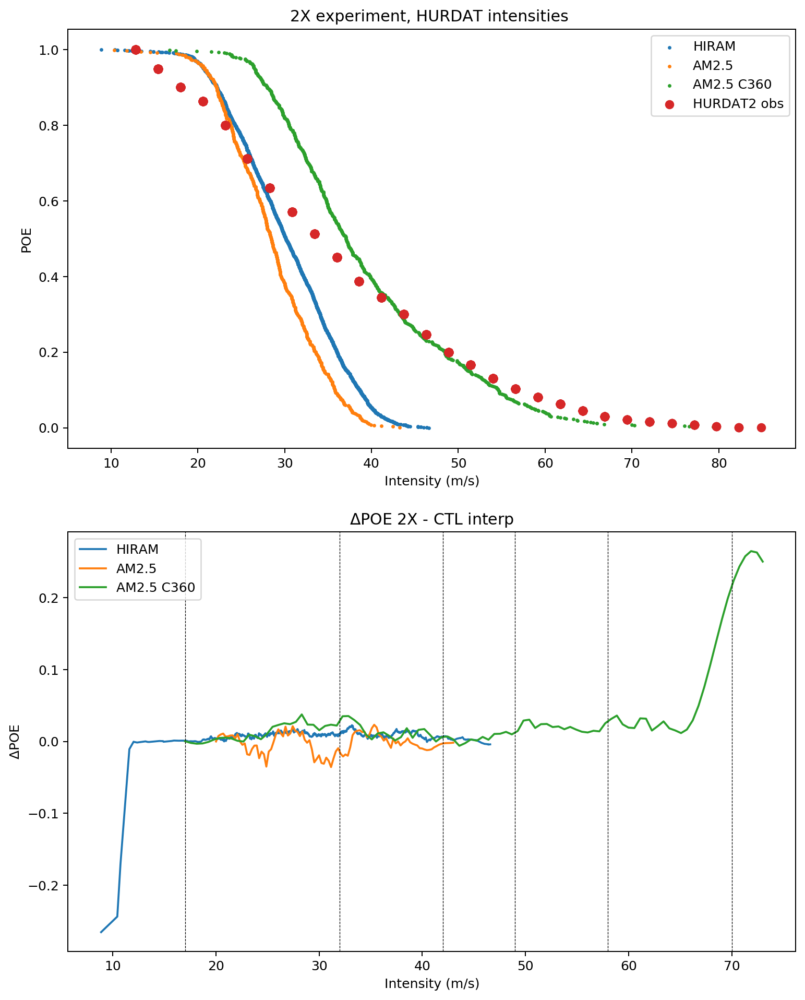

In [335]:
plt.subplots(1,1,figsize=(10,13))

ax1=plt.subplot(2,1,1)
ax1.scatter(HIRAM_wind_max,HIRAM_POE,label='HIRAM',s=3)
ax1.scatter(AM25_wind_max,AM25_POE,label='AM2.5',s=3)
ax1.scatter(AM25C360_wind_max,AM25C360_POE,label='AM2.5 C360',s=3)
ax1.scatter(hurdat_storms['Wind_max'],hurdat_storms['POE'],label='HURDAT2 obs')
ax1.set_xlabel('Intensity (m/s)')
ax1.set_ylabel('POE')
ax1.legend()
ax1.set_title('2X experiment, HURDAT intensities ')

ax2=plt.subplot(2,1,2)

u,idx = np.unique(np.array(HIRAM_POE), return_index=True)
f_HIRAM_2X = interp1d(np.unique(HIRAM_wind_max),u[np.argsort(idx)], kind='cubic')
#f_HIRAM_inv = interp1d(u[np.argsort(idx)], np.unique(HIRAM_wind_max),kind='cubic')
ax2.plot(HIRAM_wind_max,f_HIRAM_2X(HIRAM_wind_max)-f_HIRAM(HIRAM_wind_max),label='HIRAM')

AM25_winds = np.linspace(20,43,100)
u,idx = np.unique(np.array(AM25_POE), return_index=True)
f_AM25_2X = interp1d(np.unique(AM25_wind_max),u[np.argsort(idx)], kind='cubic')
#f_AM25_inv = interp1d(u[np.argsort(idx)], np.unique(AM25_wind_max),kind='cubic')
ax2.plot(AM25_winds,f_AM25_2X(AM25_winds)-f_AM25(AM25_winds),label='AM2.5')

AM25360_winds = np.linspace(17,73,100)
u,idx = np.unique(np.array(AM25C360_POE), return_index=True)
f_AM25C360_2X = interp1d(np.unique(AM25C360_wind_max),u[np.argsort(idx)], kind='cubic')
#f_AM25C360_inv = interp1d(u[np.argsort(idx)], np.unique(AM25C360_wind_max),kind='cubic')
ax2.plot(AM25360_winds,f_AM25C360_2X(AM25360_winds)-f_AM25C360(AM25360_winds),label='AM2.5 C360')

hurdat_storms_sorted=hurdat_storms.sort_values('Wind_max')
u , idx = np.unique(np.array(hurdat_storms_sorted['POE']),return_index=True)
POEs = u[np.argsort(idx)]
#f_hurdat = interp1d(np.unique(np.array(hurdat_storms_sorted['Wind_max'])),POEs, kind='cubic')
#ax2.plot(hurdat_storms_sorted['Wind_max'],f_hurdat(hurdat_storms_sorted['Wind_max']),label='HURDAT obs',lw=3)

ax2.axvline(17,lw=0.5,ls='--',c='k')
ax2.axvline(32,lw=0.5,ls='--',c='k')
ax2.axvline(42,lw=0.5,ls='--',c='k')
ax2.axvline(49,lw=0.5,ls='--',c='k')
ax2.axvline(58,lw=0.5,ls='--',c='k')
ax2.axvline(70,lw=0.5,ls='--',c='k')

ax2.set_title('$\Delta$POE 2X - CTL interp')
ax2.set_xlabel('Intensity (m/s)')
ax2.set_ylabel('$\Delta$POE')

ax2.legend()
#plt.savefig('POE_intensity_2x.png')


## all wind data

In [ ]:
#this section does the same as above, but we consider the wind speed of each storm TRACK point as a data point

### storms w warm core

In [ ]:
#for this one, we look at every track in all of the storms that have a warm core at any point

In [183]:
#load data for each model

winds_in = open(f'winds_%s_%dms.pickle'%('HIRAM',v),'rb')
winds_HIRAM = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('HIRAM',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_HIRAM_ctl=[]

for i in range(len(winds_HIRAM)):
    if exp_labels[i]=='CTL':
        winds_HIRAM_ctl.append(winds_HIRAM[i])

winds_in = open(f'winds_%s_%dms.pickle'%('AM2.5',v),'rb')
winds_AM25 = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_AM25_ctl=[]

for i in range(len(winds_AM25)):
    if exp_labels[i]=='CTL':
        winds_AM25_ctl.append(winds_AM25[i])

winds_in = open(f'winds_%s_%dms.pickle'%('AM2.5C360',v),'rb')
winds_AM25C360 = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5C360',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_AM25C360_ctl=[]

for i in range(len(winds_AM25C360)):
    if exp_labels[i]=='CTL':
        winds_AM25C360_ctl.append(winds_AM25C360[i])




In [188]:
#flatten winds list
winds_HIRAM_flat = sorted([item for sublist in winds_HIRAM_ctl for item in sublist if item==item],reverse=True)
winds_AM25_flat = sorted([item for sublist in winds_AM25_ctl for item in sublist if item==item], reverse=True)
winds_AM25C360_flat = sorted([item for sublist in winds_AM25C360_ctl for item in sublist if item==item], reverse=True)


In [189]:
#calculate POEs
v = 0.

winds_rank_HIRAM=pd.Series(winds_HIRAM_flat).rank(ascending=False)
rank_max = winds_rank_HIRAM.max()
HIRAM_POE=winds_rank_HIRAM/(rank_max+1)


winds_rank_AM25=pd.Series(winds_AM25_flat).rank(ascending=False)
rank_max = winds_rank_AM25.max()
AM25_POE=winds_rank_AM25/(rank_max+1)

winds_rank_AM25C360=pd.Series(winds_AM25C360_flat).rank(ascending=False)
rank_max = winds_rank_AM25C360.max()
AM25C360_POE=winds_rank_AM25C360/(rank_max+1)


In [190]:
#calculate HURDAT POE
hurdat_allwinds = hurdat_cluster['Wind'].multiply(0.514444).sort_values(ascending=False)
hurdat_allwinds_rank=hurdat_allwinds.rank(ascending=False)
rank_max = hurdat_allwinds_rank.max()
hurdat_allwinds_POE=hurdat_allwinds_rank/(rank_max+1)


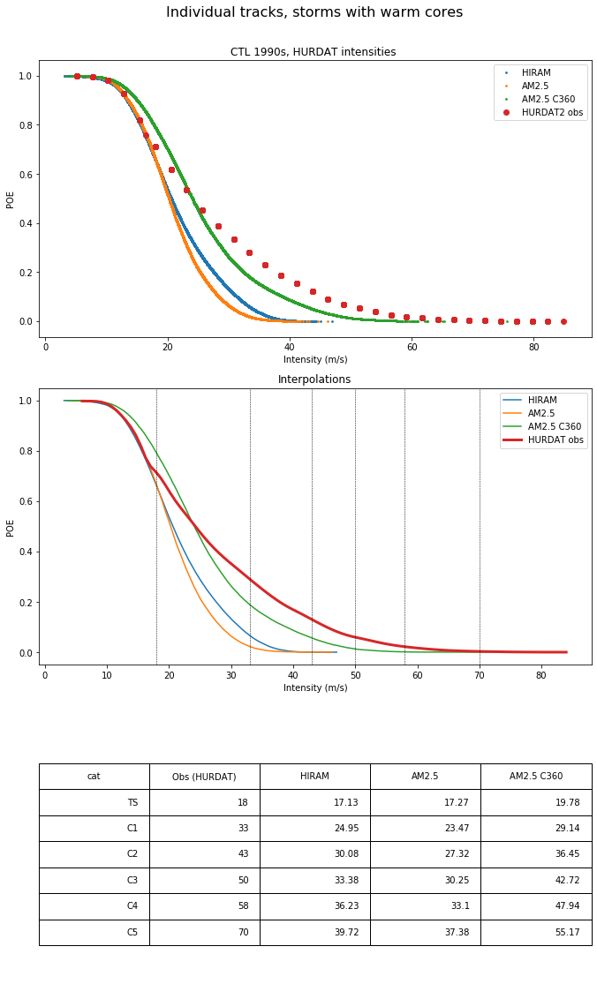

In [210]:
plt.subplots(3,1,figsize=(10,16))

ax1=plt.subplot(3,1,1)
ax1.scatter(winds_HIRAM_flat,HIRAM_POE,label='HIRAM',s=3)
ax1.scatter(winds_AM25_flat,AM25_POE,label='AM2.5',s=3)
ax1.scatter(winds_AM25C360_flat,AM25C360_POE,label='AM2.5 C360',s=3)
ax1.scatter(hurdat_allwinds,hurdat_allwinds_POE,label='HURDAT2 obs')
ax1.set_xlabel('Intensity (m/s)')
ax1.set_ylabel('POE')
ax1.legend()
ax1.set_title('CTL 1990s, HURDAT intensities ')

ax2=plt.subplot(3,1,2)

u,idx = np.unique(np.array(HIRAM_POE), return_index=True)
f_HIRAM = interp1d(np.unique(winds_HIRAM_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_HIRAM_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_HIRAM_flat),kind='cubic')

ax2.plot(winds_HIRAM_flat,f_HIRAM(winds_HIRAM_flat),label='HIRAM')

u,idx = np.unique(np.array(AM25_POE), return_index=True)
f_AM25 = interp1d(np.unique(winds_AM25_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_AM25_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_AM25_flat),kind='cubic')
ax2.plot(winds_AM25_flat,f_AM25(winds_AM25_flat),label='AM2.5')

u,idx = np.unique(np.array(AM25C360_POE), return_index=True)
f_AM25C360 = interp1d(np.unique(winds_AM25C360_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_AM25C360_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_AM25C360_flat),kind='cubic')
ax2.plot(winds_AM25C360_flat,f_AM25C360(winds_AM25C360_flat),label='AM2.5 C360')

hurdat_winds = np.linspace(6,84,100)
u , idx = np.unique(hurdat_allwinds_POE,return_index=True)
f_hurdat = interp1d(np.unique(hurdat_allwinds),np.flipud(u[np.argsort(idx)]), kind='cubic')
ax2.plot(hurdat_winds,f_hurdat(hurdat_winds),label='HURDAT obs',lw=3)



ax2.axvline(18,lw=0.5,ls='--',c='k')
ax2.axvline(33,lw=0.5,ls='--',c='k')
ax2.axvline(43,lw=0.5,ls='--',c='k')
ax2.axvline(50,lw=0.5,ls='--',c='k')
ax2.axvline(58,lw=0.5,ls='--',c='k')
ax2.axvline(70,lw=0.5,ls='--',c='k')

ax2.set_title('Interpolations')
ax2.set_xlabel('Intensity (m/s)')
ax2.set_ylabel('POE')

ax2.legend()

ax3=plt.subplot(3,1,3)
labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)

ax3.axis('off')

tab = ax3.table(cellText=cutoffs_df.values, colLabels=cutoffs_df.columns, loc='center')
tab.scale(1,2)

plt.tight_layout(rect=[0, 0, .95, .95])

plt.suptitle('Individual tracks, storms with warm cores',fontsize=16)
plt.savefig('POE_intensity_ctl_tracks_warm_storms.png')



In [196]:
labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)

cutoffs_df

,cat,Obs (HURDAT),HIRAM,AM2.5,AM2.5 C360
0,TS,18,21.35,20.59,30.65
1,C1,33,29.20,26.79,40.13
2,C2,43,32.24,29.78,44.11
3,C3,50,34.16,31.77,46.96
4,C4,58,36.12,33.60,49.81
5,C5,70,39.79,37.49,55.51


### tracks with warm core

In [ ]:
#finally, we look at only the individual tracks during which the storm has a warm core

In [236]:
v=0

In [237]:
winds_in = open(f'winds_warm_%s_%dms.pickle'%('HIRAM',v),'rb')
winds_HIRAM = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('HIRAM',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_HIRAM_ctl=[]

for i in range(len(winds_HIRAM)):
    if exp_labels[i]=='CTL':
        winds_HIRAM_ctl.append(winds_HIRAM[i])

winds_in = open(f'winds_warm_%s_%dms.pickle'%('AM2.5',v),'rb')
winds_AM25 = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_AM25_ctl=[]

for i in range(len(winds_AM25)):
    if exp_labels[i]=='CTL':
        winds_AM25_ctl.append(winds_AM25[i])

winds_in = open(f'winds_warm_%s_%dms.pickle'%('AM2.5C360',v),'rb')
winds_AM25C360 = pickle.load(winds_in)

all_storms_ds = xr.open_dataset(f'/tigress/tessj/data/%s_all_storms_%dms.nc'%('AM2.5C360',v))
all_storms_df = xr.Dataset.to_dataframe(all_storms_ds)

exp_labels = all_storms_df.Experiment.values.tolist()
winds_AM25C360_ctl=[]

for i in range(len(winds_AM25C360)):
    if exp_labels[i]=='CTL':
        winds_AM25C360_ctl.append(winds_AM25C360[i])




In [238]:
winds_HIRAM_flat = sorted([item for sublist in winds_HIRAM_ctl for item in sublist if item==item],reverse=True)
winds_AM25_flat = sorted([item for sublist in winds_AM25_ctl for item in sublist if item==item], reverse=True)
winds_AM25C360_flat = sorted([item for sublist in winds_AM25C360_ctl for item in sublist if item==item], reverse=True)


In [239]:
v = 0.

winds_rank_HIRAM=pd.Series(winds_HIRAM_flat).rank(ascending=False)
rank_max = winds_rank_HIRAM.max()
HIRAM_POE=winds_rank_HIRAM/(rank_max+1)

winds_rank_AM25=pd.Series(winds_AM25_flat).rank(ascending=False)
rank_max = winds_rank_AM25.max()
AM25_POE=winds_rank_AM25/(rank_max+1)

winds_rank_AM25C360=pd.Series(winds_AM25C360_flat).rank(ascending=False)
rank_max = winds_rank_AM25C360.max()
AM25C360_POE=winds_rank_AM25C360/(rank_max+1)


In [240]:
u,idx = np.unique(np.array(HIRAM_POE), return_index=True)



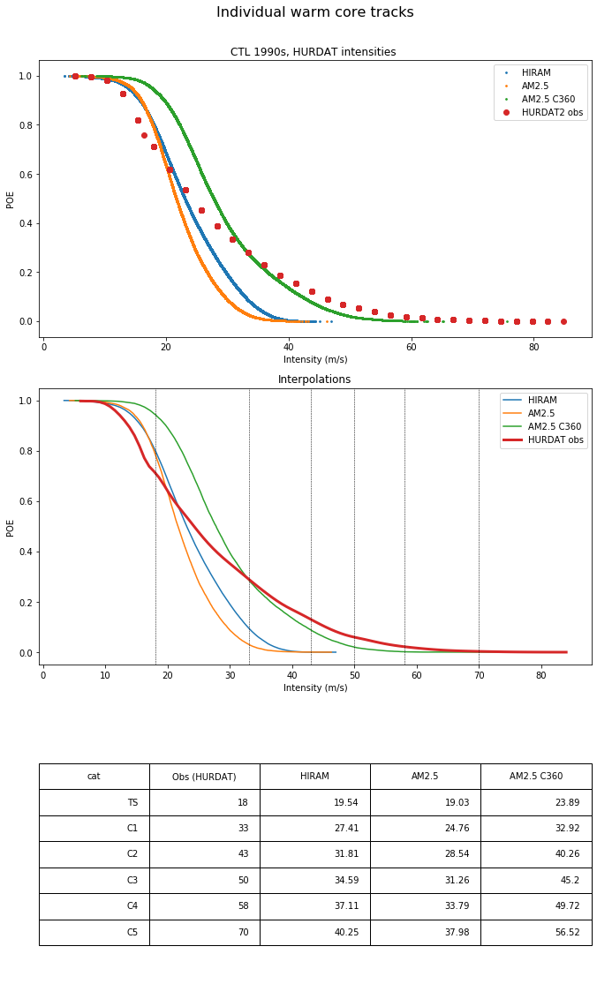

In [241]:
plt.subplots(3,1,figsize=(10,16))

ax1=plt.subplot(3,1,1)
ax1.scatter(winds_HIRAM_flat,HIRAM_POE,label='HIRAM',s=3)
ax1.scatter(winds_AM25_flat,AM25_POE,label='AM2.5',s=3)
ax1.scatter(winds_AM25C360_flat,AM25C360_POE,label='AM2.5 C360',s=3)
ax1.scatter(hurdat_allwinds,hurdat_allwinds_POE,label='HURDAT2 obs')
ax1.set_xlabel('Intensity (m/s)')
ax1.set_ylabel('POE')
ax1.legend()
ax1.set_title('CTL 1990s, HURDAT intensities ')

ax2=plt.subplot(3,1,2)

u,idx = np.unique(np.array(HIRAM_POE), return_index=True)
f_HIRAM = interp1d(np.unique(winds_HIRAM_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_HIRAM_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_HIRAM_flat),kind='cubic')

ax2.plot(winds_HIRAM_flat,f_HIRAM(winds_HIRAM_flat),label='HIRAM')

u,idx = np.unique(np.array(AM25_POE), return_index=True)
f_AM25 = interp1d(np.unique(winds_AM25_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_AM25_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_AM25_flat),kind='cubic')
ax2.plot(winds_AM25_flat,f_AM25(winds_AM25_flat),label='AM2.5')

u,idx = np.unique(np.array(AM25C360_POE), return_index=True)
f_AM25C360 = interp1d(np.unique(winds_AM25C360_flat),np.flipud(u[np.argsort(idx)]), kind='cubic')
f_AM25C360_inv = interp1d(np.flipud(u[np.argsort(idx)]), np.unique(winds_AM25C360_flat),kind='cubic')
ax2.plot(winds_AM25C360_flat,f_AM25C360(winds_AM25C360_flat),label='AM2.5 C360')

hurdat_winds = np.linspace(6,84,100)
u , idx = np.unique(hurdat_allwinds_POE,return_index=True)
f_hurdat = interp1d(np.unique(hurdat_allwinds),np.flipud(u[np.argsort(idx)]), kind='cubic')
ax2.plot(hurdat_winds,f_hurdat(hurdat_winds),label='HURDAT obs',lw=3)



ax2.axvline(18,lw=0.5,ls='--',c='k')
ax2.axvline(33,lw=0.5,ls='--',c='k')
ax2.axvline(43,lw=0.5,ls='--',c='k')
ax2.axvline(50,lw=0.5,ls='--',c='k')
ax2.axvline(58,lw=0.5,ls='--',c='k')
ax2.axvline(70,lw=0.5,ls='--',c='k')

ax2.set_title('Interpolations')
ax2.set_xlabel('Intensity (m/s)')
ax2.set_ylabel('POE')

ax2.legend()

ax3=plt.subplot(3,1,3)
labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)

ax3.axis('off')

tab = ax3.table(cellText=cutoffs_df.values, colLabels=cutoffs_df.columns, loc='center')
tab.scale(1,2)

plt.tight_layout(rect=[0, 0, .95, .95])

plt.suptitle('Individual warm core tracks',fontsize=16)
plt.savefig('POE_intensity_ctl_tracks_warm.png')



In [156]:
labels = ['TS','C1','C2','C3','C4','C5']
HURDAT_cutoffs = [18,33,43,50,58,70]
HIRAM_cutoffs = [f_HIRAM_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25_cutoffs = [f_AM25_inv(f_hurdat(x)) for x in HURDAT_cutoffs]
AM25C360_cutoffs = [f_AM25C360_inv(f_hurdat(x)) for x in HURDAT_cutoffs]

cutoffs_df = pd.DataFrame(list(zip(labels,HURDAT_cutoffs, HIRAM_cutoffs,AM25_cutoffs,AM25C360_cutoffs)), 
               columns =['cat','Obs (HURDAT)', 'HIRAM','AM2.5','AM2.5 C360'])
cutoffs_df.HIRAM=cutoffs_df.HIRAM.astype(float).round(2)
cutoffs_df['AM2.5']=cutoffs_df['AM2.5'].astype(float).round(2)
cutoffs_df['AM2.5 C360']=cutoffs_df['AM2.5 C360'].astype(float).round(2)

cutoffs_df

,cat,Obs (HURDAT),HIRAM,AM2.5,AM2.5 C360
0,TS,18,28.49,27.14,41.71
1,C1,33,21.24,21.80,33.40
2,C2,43,16.63,18.03,26.17
3,C3,50,13.63,15.19,21.03
4,C4,58,10.95,12.61,17.12
5,C5,70,7.45,8.85,12.19


# more TC variables

In [ ]:
#plotting more TC genesis indices and other variables!

In [22]:
lambda_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/lambda.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'}).LAMBDA.squeeze(drop=True)
lambda_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/lambda.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'}).LAMBDA.squeeze(drop=True)
chitang_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/chitang.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'}).CHI.squeeze(drop=True)
chitang_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/chitang.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'}).CHI.squeeze(drop=True)
thermvars_2x = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/thermvars.nc'%(exp['model'],exp['plus2x'])).rename({'Y2':'lat','X2':'lon'})
thermvars_ctl = xr.open_dataset('/tigress/gvecchi/ANALYSIS/MODEL_TC_ANALYSIS/%s_TC_VARS/%s/thermvars.nc'%(exp['model'],exp['ctl'])).rename({'Y2':'lat','X2':'lon'})

In [23]:
PI_2x = thermvars_2x.PI.squeeze(drop=True)
PI_ctl = thermvars_ctl.PI.squeeze(drop=True)

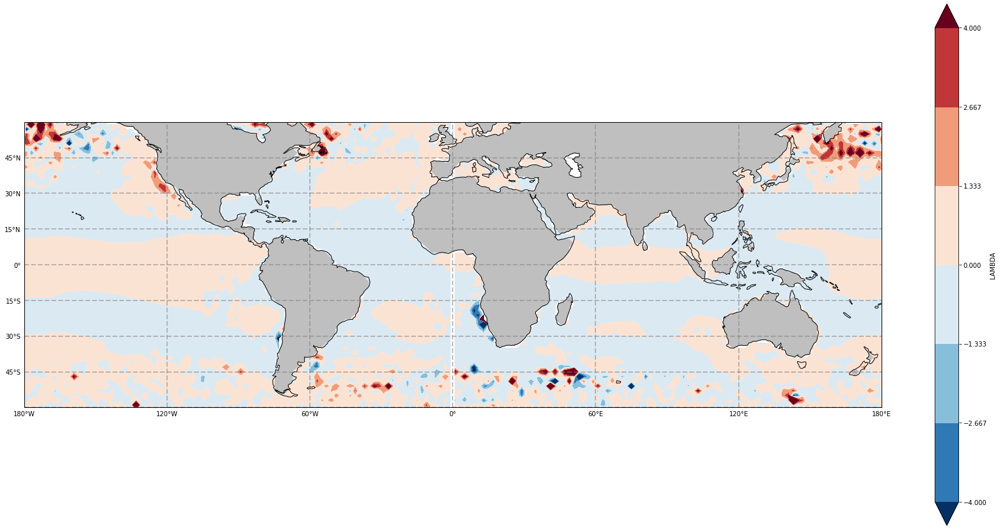

In [33]:
#plot ventilation index anomaly
plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax2.set_extent([-180,180,-60, 60], ccrs.PlateCarree())
(lambda_2x-lambda_ctl).mean('TIME').plot.contourf(robust=True,cmap='RdBu_r',vmin=-4,vmax=4)
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

#ax2.set_title(f'%s VI anomaly'%exp['model'],fontsize=28)
#should we be looking at Jun-Nov?

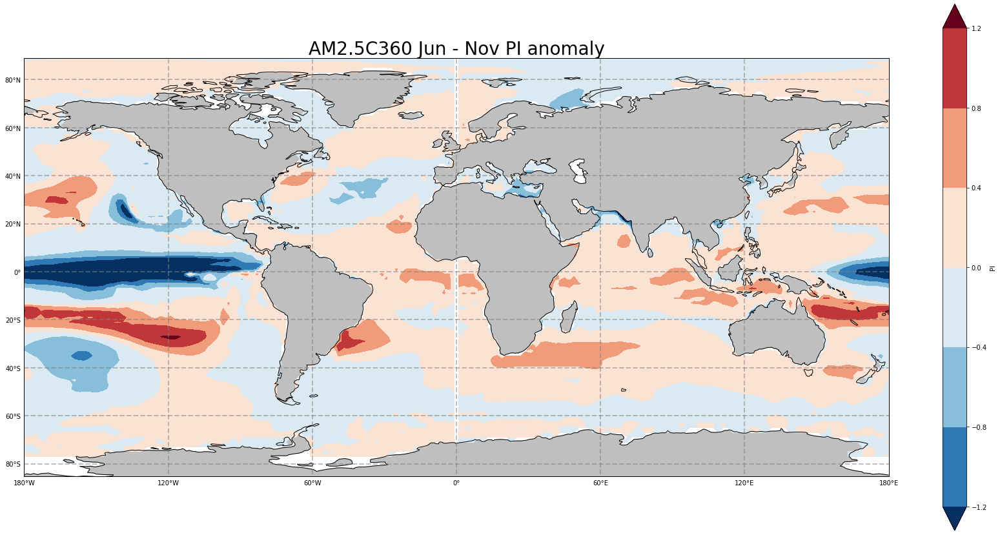

In [25]:
#plot potential intensity anomaly
plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(PI_2x-PI_ctl).groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month').plot.contourf(robust=True,cmap='RdBu_r')
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s Jun - Nov PI anomaly'%exp['model'],fontsize=28)


plt.savefig(f'%s_PI.png'%exp['model'])

In [ ]:
#plot chi (tang) anomaly
plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(chitang_2x-chitang_ctl).mean('TIME').plot.contourf(robust=True,cmap='RdBu_r')
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s CHI anomaly'%exp['model'],fontsize=28)
#should we be looking at Jun-Nov?

Text(0.5, 1.0, 'AM2.5C360 probability anomaly')

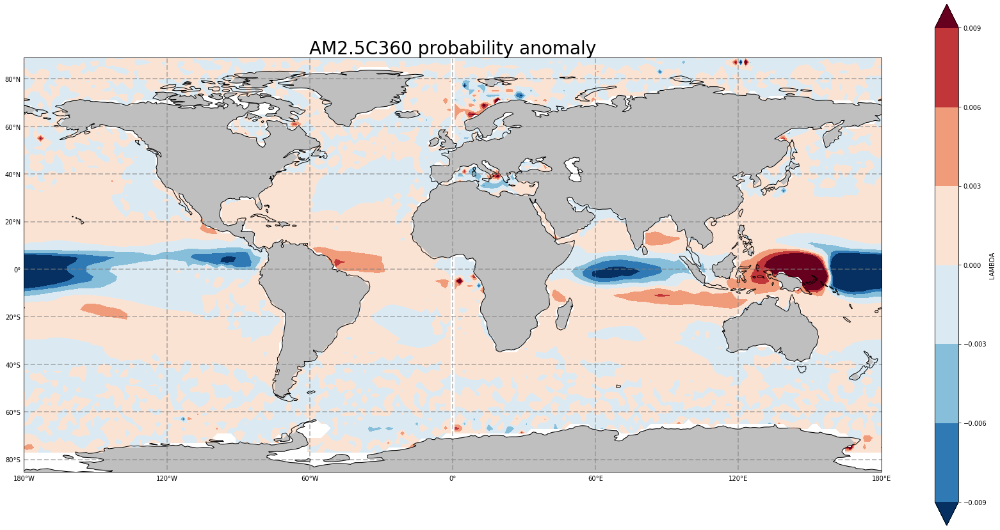

In [28]:
#plot probability anomaly based on lambda

#p_lambda_2x = 0.02/(0.02 + lambda_2x.groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month'))
#p_lambda_ctl = 0.02/(0.02 + lambda_ctl.groupby('TIME.month').mean('TIME').sel(month=[6,7,8,9,10,11]).mean('month'))
p_lambda_2x = 0.02/(0.02 + lambda_2x.mean('TIME'))
p_lambda_ctl = 0.02/(0.02 + lambda_ctl.mean('TIME'))


plt.figure(figsize=(30,15))

ax2=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
(p_lambda_2x-p_lambda_ctl).plot.contourf(robust=True,cmap='RdBu_r',vmax=0.009)
#ax2.set_extent([-100, 0, 0, 70], ccrs.PlateCarree())
gl=ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top=False
gl.ylabels_right=False
gl.xformatter=LONGITUDE_FORMATTER
gl.yformatter=LATITUDE_FORMATTER
ax2.add_feature(cfeature.LAND, facecolor='0.75')
ax2.coastlines()

ax2.set_title(f'%s probability anomaly'%exp['model'],fontsize=28)

#plt.savefig(f'%s_p_lambda.png'%exp['model'])
#should we be looking at Jun-Nov?

#log(VI) probability form
#poleward of 10 degrees
#0.02 / (0.02 + lambda)